<a href="https://colab.research.google.com/github/firarru/TA/blob/main/code%20coba%20tanpa%20sliding.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

#**Read Dataset**

In [4]:
url2020 = 'https://raw.githubusercontent.com/firarru/TA/refs/heads/main/Data/2020.csv'
url2021 = 'https://raw.githubusercontent.com/firarru/TA/refs/heads/main/Data/2021.csv'

df20 = pd.read_csv(url2020, sep=';')
df21 = pd.read_csv(url2021, sep=';')

/tmp/ipykernel_3431/3864618148.py:4: DtypeWarning: Columns (11,12,16,20) have mixed types. Specify dtype option on import or set low_memory=False.
  df20 = pd.read_csv(url2020, sep=';')
/tmp/ipykernel_3431/3864618148.py:5: DtypeWarning: Columns (12,13,14,15,16,19) have mixed types. Specify dtype option on import or set low_memory=False.
  df21 = pd.read_csv(url2021, sep=';')


In [5]:
df20.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61474 entries, 0 to 61473
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   DATE_STAMP   61474 non-null  object 
 1   ASSET_ID     61474 non-null  int64  
 2   PRESSURE     61474 non-null  object 
 3   TEMPERATURE  61474 non-null  object 
 4   ENERGY_RATE  61474 non-null  object 
 5   VOLUME_RATE  61474 non-null  object 
 6   C1           0 non-null      float64
 7   C2           61474 non-null  object 
 8   C3           61474 non-null  object 
 9   IC4          61474 non-null  object 
 10  NC4          61474 non-null  object 
 11  IC5          61474 non-null  object 
 12  NC5          61474 non-null  object 
 13  C6           61474 non-null  object 
 14  C7           61474 non-null  object 
 15  C8           61474 non-null  object 
 16  C9           61474 non-null  object 
 17  N2           61474 non-null  object 
 18  CO2          61474 non-null  object 
 19  H2O 

In [6]:
df21.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61313 entries, 0 to 61312
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   DATE_STAMP   61313 non-null  object 
 1   ASSET_ID     61313 non-null  int64  
 2   PRESSURE     61313 non-null  object 
 3   TEMPERATURE  61313 non-null  object 
 4   ENERGY_RATE  61313 non-null  object 
 5   VOLUME_RATE  61313 non-null  object 
 6   C1           0 non-null      float64
 7   C2           61313 non-null  object 
 8   C3           61313 non-null  object 
 9   IC4          61313 non-null  object 
 10  NC4          61313 non-null  object 
 11  IC5          61313 non-null  object 
 12  NC5          61313 non-null  object 
 13  C6           61313 non-null  object 
 14  C7           61313 non-null  object 
 15  C8           61313 non-null  object 
 16  C9           61313 non-null  object 
 17  N2           61313 non-null  object 
 18  CO2          61313 non-null  object 
 19  H2O 

# **Preprocessing**

Menggabungkan Data

In [7]:
df20['DATE_STAMP'] = pd.to_datetime(df20['DATE_STAMP'], errors='coerce')
df21['DATE_STAMP'] = pd.to_datetime(df21['DATE_STAMP'], errors='coerce')

In [8]:
df = pd.concat([df20, df21], ignore_index=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 122787 entries, 0 to 122786
Data columns (total 21 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   DATE_STAMP   122787 non-null  datetime64[ns]
 1   ASSET_ID     122787 non-null  int64         
 2   PRESSURE     122787 non-null  object        
 3   TEMPERATURE  122787 non-null  object        
 4   ENERGY_RATE  122787 non-null  object        
 5   VOLUME_RATE  122787 non-null  object        
 6   C1           0 non-null       float64       
 7   C2           122787 non-null  object        
 8   C3           122787 non-null  object        
 9   IC4          122787 non-null  object        
 10  NC4          122787 non-null  object        
 11  IC5          122787 non-null  object        
 12  NC5          122787 non-null  object        
 13  C6           122787 non-null  object        
 14  C7           122787 non-null  object        
 15  C8           122787 non-null  obje

Filter Periode Data

In [9]:
df['DATE_STAMP'] = pd.to_datetime(df['DATE_STAMP'])

df_filter = df.loc[
    (df['DATE_STAMP'] >= '2020-06-01 00:00:00') &
    (df['DATE_STAMP'] <= '2021-06-30 23:00:00')
].reset_index(drop=True)

Filter Feature

In [10]:
df = df_filter[['DATE_STAMP', 'ASSET_ID', 'PRESSURE']]
df

,DATE_STAMP,ASSET_ID,PRESSURE
0,2020-06-01 00:00:00,133071,58.910.308.837.890.600
1,2020-06-01 00:00:00,133004,15.661.116.943.359.300
2,2020-06-01 00:00:00,133002,15.512.724.609.375
3,2020-06-01 00:00:00,133003,1.500.152.587.890.620
4,2020-06-01 00:00:00,133060,12.791.077.880.859.300
...,...,...,...
66341,2021-06-30 23:00:00,133004,14.935.035.400.390.600
66342,2021-06-30 23:00:00,133070,57.954.241.943.359.300
66343,2021-06-30 23:00:00,133003,14.158.846.435.546.800
66344,2021-06-30 23:00:00,133071,5.889.481.201.171.870


Transformasi

In [11]:
df['PRESSURE'] = (df['PRESSURE'].astype(str).str.replace(".", "", regex=False).astype(float))

/tmp/ipykernel_3431/898852785.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['PRESSURE'] = (df['PRESSURE'].astype(str).str.replace(".", "", regex=False).astype(float))


In [12]:
asset_name_mapping = {
    133001: 'Anoa',
    133002: 'Kakap',
    133003: 'Hang Tuah',
    133004: 'Gajah Baru',
    133060: 'ORF'
}

df['ASSET_ID'] = df['ASSET_ID'].replace(asset_name_mapping)

df = df[df['ASSET_ID'].isin(asset_name_mapping.values())]

/tmp/ipykernel_3431/3313337121.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['ASSET_ID'] = df['ASSET_ID'].replace(asset_name_mapping)


In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 47390 entries, 1 to 66345
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   DATE_STAMP  47390 non-null  datetime64[ns]
 1   ASSET_ID    47390 non-null  object        
 2   PRESSURE    47390 non-null  float64       
dtypes: datetime64[ns](1), float64(1), object(1)
memory usage: 1.4+ MB


In [14]:
df

,DATE_STAMP,ASSET_ID,PRESSURE
1,2020-06-01 00:00:00,Gajah Baru,1.566112e+16
2,2020-06-01 00:00:00,Kakap,1.551272e+13
3,2020-06-01 00:00:00,Hang Tuah,1.500153e+15
4,2020-06-01 00:00:00,ORF,1.279108e+16
5,2020-06-01 00:00:00,Anoa,1.555127e+12
...,...,...,...
66339,2021-06-30 23:00:00,ORF,1.218315e+15
66340,2021-06-30 23:00:00,Anoa,1.478760e+12
66341,2021-06-30 23:00:00,Gajah Baru,1.493504e+16
66343,2021-06-30 23:00:00,Hang Tuah,1.415885e+16


In [15]:
df['ASSET_ID'].groupby(df['ASSET_ID']).count()

,ASSET_ID
ASSET_ID,
Anoa,9478
Gajah Baru,9478
Hang Tuah,9478
Kakap,9478
ORF,9478


Standarisasi

In [16]:
from sklearn.preprocessing import StandardScaler

scaler= StandardScaler()
df['PRESSURE_NORM'] = scaler.fit_transform(df[['PRESSURE']])

/tmp/ipykernel_3431/4207058671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['PRESSURE_NORM'] = scaler.fit_transform(df[['PRESSURE']])


In [17]:
df.head(10)

,DATE_STAMP,ASSET_ID,PRESSURE,PRESSURE_NORM
1,2020-06-01 00:00:00,Gajah Baru,1.566112e+16,1.407010
2,2020-06-01 00:00:00,Kakap,1.551272e+13,-0.628546
3,2020-06-01 00:00:00,Hang Tuah,1.500153e+15,-0.435388
4,2020-06-01 00:00:00,ORF,1.279108e+16,1.033607
5,2020-06-01 00:00:00,Anoa,1.555127e+12,-0.630362
8,2020-06-01 01:00:00,Gajah Baru,1.563403e+13,-0.628530
9,2020-06-01 01:00:00,Anoa,1.552637e+11,-0.630544
10,2020-06-01 01:00:00,Kakap,1.549067e+15,-0.429024
12,2020-06-01 01:00:00,Hang Tuah,1.498398e+16,1.318912
13,2020-06-01 01:00:00,ORF,1.282924e+16,1.038572


# **Menghitung Bobot Edge**

In [18]:
#Memisahkan source dg sink
df_orf = df[df['ASSET_ID'] == 'ORF']
df_orf = df_orf.rename(columns={
    'PRESSURE': 'PRESSURE_ORF',
    'PRESSURE_NORM': 'PRESSURE_NORM_ORF',
    'ASSET_ID': 'ID_ORF'})
df_orf.shape

(9478, 4)

In [19]:
df_fix = pd.merge(df, df_orf, on='DATE_STAMP')
df_fix = df_fix.drop(columns=['ID_ORF'])
df_fix = df_fix[df_fix['ASSET_ID'] != 'ORF'].reset_index(drop=True)

In [20]:
df_fix.head()

,DATE_STAMP,ASSET_ID,PRESSURE,PRESSURE_NORM,PRESSURE_ORF,PRESSURE_NORM_ORF
0,2020-06-01 00:00:00,Gajah Baru,1.566112e+16,1.407010,1.279108e+16,1.033607
1,2020-06-01 00:00:00,Kakap,1.551272e+13,-0.628546,1.279108e+16,1.033607
2,2020-06-01 00:00:00,Hang Tuah,1.500153e+15,-0.435388,1.279108e+16,1.033607
3,2020-06-01 00:00:00,Anoa,1.555127e+12,-0.630362,1.279108e+16,1.033607
4,2020-06-01 01:00:00,Gajah Baru,1.563403e+13,-0.628530,1.282924e+16,1.038572


In [21]:
#menghitung selisih bobot sink - source berdasarkan waktu t
df_fix['WEIGHT'] = (df_fix['PRESSURE_NORM_ORF'] - df_fix['PRESSURE_NORM']).abs()

In [22]:
df_fix

,DATE_STAMP,ASSET_ID,PRESSURE,PRESSURE_NORM,PRESSURE_ORF,PRESSURE_NORM_ORF,WEIGHT
0,2020-06-01 00:00:00,Gajah Baru,1.566112e+16,1.407010,1.279108e+16,1.033607,0.373404
1,2020-06-01 00:00:00,Kakap,1.551272e+13,-0.628546,1.279108e+16,1.033607,1.662153
2,2020-06-01 00:00:00,Hang Tuah,1.500153e+15,-0.435388,1.279108e+16,1.033607,1.468995
3,2020-06-01 00:00:00,Anoa,1.555127e+12,-0.630362,1.279108e+16,1.033607,1.663969
4,2020-06-01 01:00:00,Gajah Baru,1.563403e+13,-0.628530,1.282924e+16,1.038572,1.667102
...,...,...,...,...,...,...,...
37907,2021-06-30 22:00:00,Kakap,1.481314e+15,-0.437839,1.217497e+16,0.953448,1.391288
37908,2021-06-30 23:00:00,Anoa,1.478760e+12,-0.630372,1.218315e+15,-0.472057,0.158315
37909,2021-06-30 23:00:00,Gajah Baru,1.493504e+16,1.312544,1.218315e+15,-0.472057,1.784601
37910,2021-06-30 23:00:00,Hang Tuah,1.415885e+16,1.211559,1.218315e+15,-0.472057,1.683615


# **Visualisasi Graf**

**Visualisasi Graph**

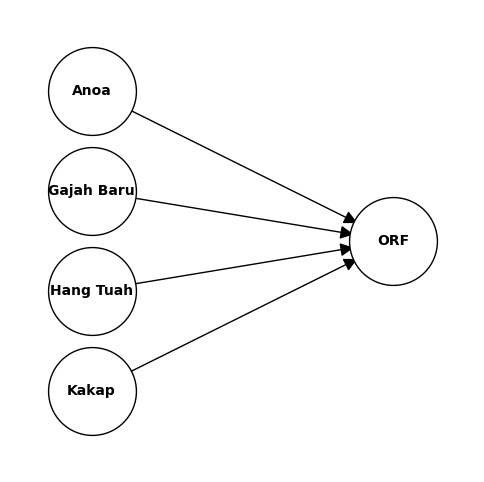

In [23]:
import networkx as nx

#Inisialisasi Graf Berarah
G = nx.DiGraph()

sources = ["Anoa", "Gajah Baru", "Hang Tuah", "Kakap"]
sink = "ORF"

#Menambah Edge
for s in sources:
    G.add_edge(s, sink)

#Posisi Node
pos = {
    "Anoa": (-1, 3),
    "Gajah Baru": (-1, 1),
    "Hang Tuah": (-1, -1),
    "Kakap": (-1, -3),
    "ORF": (1, 0)
}

#Visualisasi
plt.figure(figsize=(6, 6))
nx.draw_networkx_nodes(G, pos, nodelist=sources, node_color='white', node_size=4000, edgecolors='black')
nx.draw_networkx_nodes(G, pos, nodelist=[sink], node_color='white', node_size=4000, edgecolors='black')

#Gambar Edge dan Label
nx.draw_networkx_edges(G, pos, edge_color='black', arrows=True, arrowstyle='-|>', arrowsize=20, min_source_margin=10, min_target_margin=29)
nx.draw_networkx_labels(G, pos, font_size=10, font_weight='bold')

plt.axis('off')
plt.margins(0.2)
plt.show()

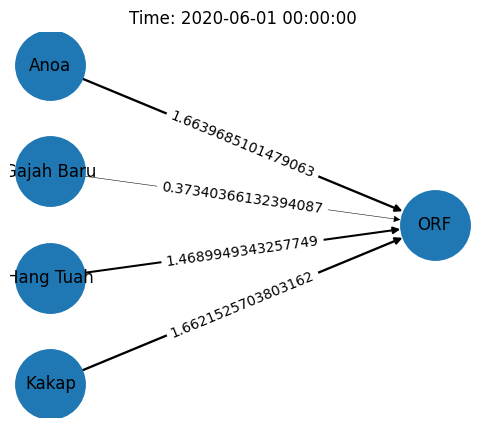

In [24]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

#mengambil waktu unik pada 1 minggu pertama
times = df_fix['DATE_STAMP'].unique()[:168]

#definisi posisi node agar konsisten untuk setiap gambar
pos = {
    "Anoa": (-1, 3),
    "Gajah Baru": (-1, 1),
    "Hang Tuah": (-1, -1),
    "Kakap": (-1, -3),
    "ORF": (1, 0)
}

fig, ax = plt.subplots(figsize=(6, 5))

def update(frame):
  ax.clear()

  #filter data dari setiap timestamp pada frame ke-i
  df_t = df_fix[df_fix['DATE_STAMP'] == times[frame]]

  #membuat graph berarah
  G = nx.DiGraph()

  #menambahkan edge
  for _, row in df_t.iterrows():
    source = row['ASSET_ID']
    weight = row['WEIGHT']
    G.add_edge(source, 'ORF', weight=weight)

  weights = [abs(G[u][v]['weight']) for u, v in G.edges()]

  #menampilkan graph
  nx.draw(
      G,
      pos,
      ax=ax,
      with_labels=True,
      node_size=2500,
      arrows=True,
      width=weights
  )

  #memampilkan label bobot
  edge_labels = nx.get_edge_attributes(G, 'weight')
  nx.draw_networkx_edge_labels(pos=pos, G=G, edge_labels=edge_labels, ax=ax)

  ax.set_title(f'Time: {times[frame]}')
  ax.axis('off')

#membuat animasi
ani = FuncAnimation(fig, update, frames=len(times), interval=200)

HTML(ani.to_jshtml())


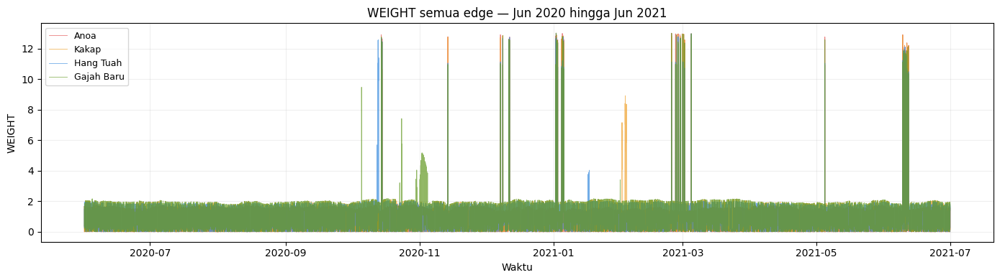

In [25]:
colors_asset = {
    'Anoa'      : '#E24B4A',
    'Kakap'     : '#EF9F27',
    'Hang Tuah' : '#378ADD',
    'Gajah Baru': '#639922'
}

fig, ax = plt.subplots(figsize=(14, 4))

for asset, color in colors_asset.items():
    df_a = df_fix[df_fix['ASSET_ID'] == asset]
    ax.plot(df_a['DATE_STAMP'], df_a['WEIGHT'],
            color=color, linewidth=0.6, alpha=0.7, label=asset)

ax.set_title('WEIGHT semua edge — Jun 2020 hingga Jun 2021', fontsize=12)
ax.set_xlabel('Waktu')
ax.set_ylabel('WEIGHT')
ax.legend(fontsize=9)
ax.grid(alpha=0.2)
plt.tight_layout()
plt.show()

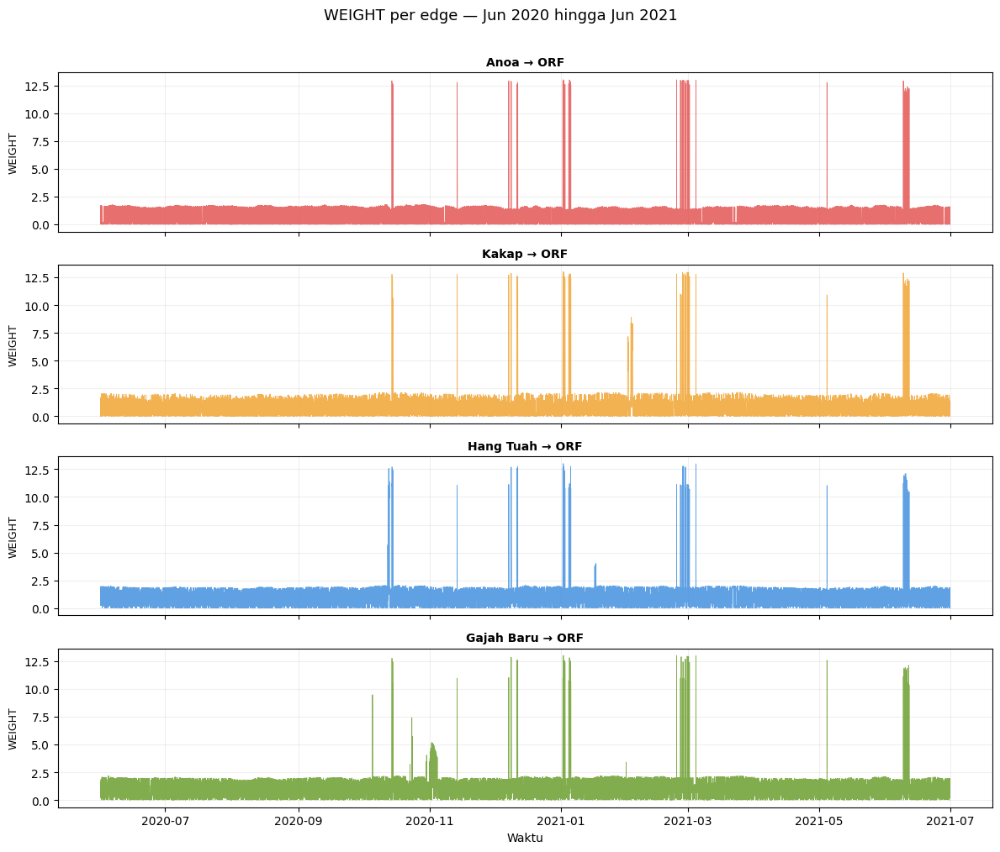

In [26]:
assets = ['Anoa', 'Kakap', 'Hang Tuah', 'Gajah Baru']

fig, axes = plt.subplots(4, 1, figsize=(12,10), sharex=True)

for ax, asset in zip(axes, assets):
  df_asset = df_fix[df_fix['ASSET_ID'] == asset]
  color = colors_asset[asset]

  ax.plot(df_asset['DATE_STAMP'], df_asset['WEIGHT'],
          color=color, linewidth=0.6, alpha=0.8)
  ax.set_ylabel('WEIGHT', fontsize=9)
  ax.set_title(f'{asset} → ORF', fontsize=10, fontweight='bold')
  ax.grid(alpha=0.2)

axes[-1].set_xlabel('Waktu')
plt.suptitle('WEIGHT per edge — Jun 2020 hingga Jun 2021', fontsize=13, y=1.01)
plt.tight_layout()
plt.show()

# **Concept Drift**

Concept drift terjadi ketika distribusi statistik data berubah secara signifikan seiring waktu, sehingga model yang dilatih pada data historis menjadi tidak relevan untuk data saat ini. Pada data deret waktu, concept drift dapat dilihat dari perubahan distribusi nilai antar periode

**Metode Deteksi:**

Digunakan **Kolmogorov-Smirnov (KS) Test** untuk membandingkan distribusi bobot edge antar periode bulanan. Jika p-value < 0.05, distribusi dua periode tersebut berbeda secara signifikan → indikasi concept drift.

- **KS Statistic mendekati 1** → distribusi sangat berbeda
- **p-value < 0.05** → perbedaan signifikan (ada drift)
- **p-value ≥ 0.05** → distribusi stabil (tidak ada drift)

In [27]:
df_fix['YEAR_MONTH'] = df_fix['DATE_STAMP'].dt.to_period('M')
periods = sorted(df_fix['YEAR_MONTH'].unique())

print(f'Periode data: {periods[0]} s/d {periods[-1]} ({len(periods)} bulan)')

Periode data: 2020-06 s/d 2021-06 (13 bulan)


In [28]:
from scipy.stats import ks_2samp

drift_records = []

for asset in sorted(df_fix['ASSET_ID'].unique()):
  df_asset = df_fix[df_fix['ASSET_ID'] == asset]
  # print(f'\n=== Edge: {asset} → ORF ===')
  # print(f'  {"Periode":>20} | {"KS Stat":>8} | {"p-value":>10} | {"Status":>12}')
  # print('  ' + '-' * 60)

  for i in range(len(periods) - 1):
    p1_data = df_asset[df_asset['YEAR_MONTH'] == periods[i]]['WEIGHT'].dropna().values
    p2_data = df_asset[df_asset['YEAR_MONTH'] == periods[i+1]]['WEIGHT'].dropna().values

    if len(p1_data) < 10 or len(p2_data) < 0:
      continue

    stat, p_value = ks_2samp(p1_data, p2_data)
    status = 'DRIFT' if p_value < 0.05 else '✓  Stabil'

    drift_records.append({
        'Asset' : asset,
        'Periode 1' : periods[i],
        'Periode 2' : periods[i+1],
        'KS Stat' : round(stat, 4),
        'p-value' : p_value,
        'Drift' : p_value < 0.5,
        'Status' : status
    })

    #print (f'  {str(periods[i])} → {str(periods[i+1])} | {stat:>8.4f} | {p_value:>10.4f} | {status}')

In [29]:
df_drift = pd.DataFrame(drift_records)
print('=== Ringkasan Concept Drift ===')
total = len(df_drift)
n_drift = df_drift['Drift'].sum()
print(f'Total perbandingan periode : {total}')
print(f'Terindikasi drift          : {n_drift} ({100*n_drift/total:.1f}%)')
print(f'Stabil                     : {total - n_drift} ({100*(total-n_drift)/total:.1f}%)')
print(f"Rata-rata KS Statistic     : {df_drift['KS Stat'].mean():.4f}")
print(f"Nilai KS Stat < 0.10       : {(df_drift['KS Stat'] < 0.10).sum()} dari {len(df_drift)} perbandingan")

=== Ringkasan Concept Drift ===
Total perbandingan periode : 48
Terindikasi drift          : 46 (95.8%)
Stabil                     : 2 (4.2%)
Rata-rata KS Statistic     : 0.1026
Nilai KS Stat < 0.10       : 27 dari 48 perbandingan


In [30]:
df_drift.head()

,Asset,Periode 1,Periode 2,KS Stat,p-value,Drift,Status
0,Anoa,2020-06,2020-07,0.1629,5.985012e-09,True,DRIFT
1,Anoa,2020-07,2020-08,0.1709,6.813569e-10,True,DRIFT
2,Anoa,2020-08,2020-09,0.1123,1.765788e-04,True,DRIFT
3,Anoa,2020-09,2020-10,0.0999,1.219796e-03,True,DRIFT
4,Anoa,2020-10,2020-11,0.1104,2.395098e-04,True,DRIFT


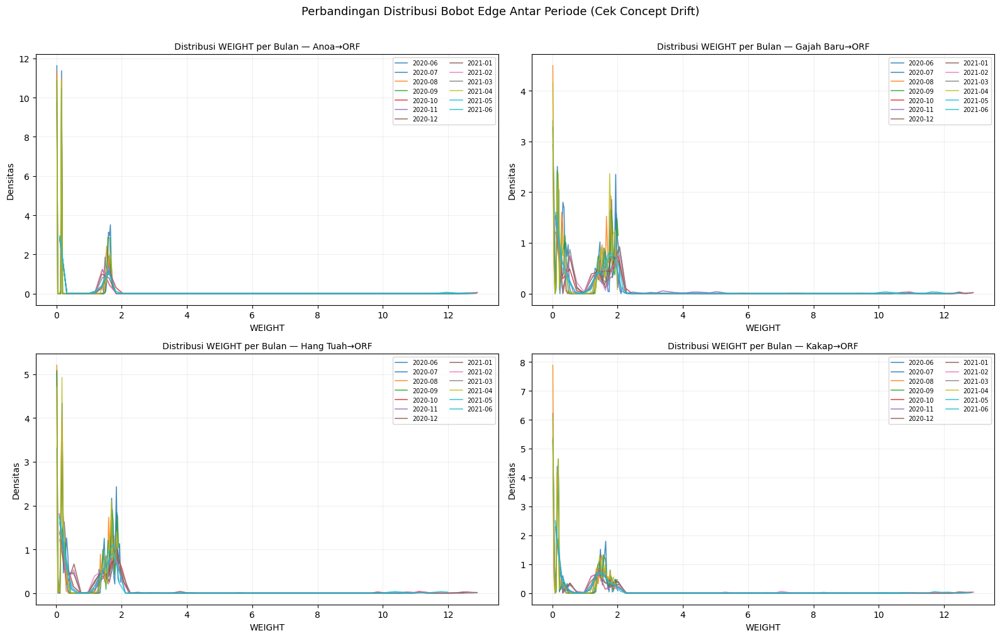

In [31]:
# Visualisasi distribusi WEIGHT per periode per asset (line chart distribusi)
fig, axes = plt.subplots(2, 2, figsize=(16, 10), sharey=False)
axes = axes.flatten()
color_palette = plt.cm.tab10(np.linspace(0, 1, len(periods)))

for ax_idx, asset in enumerate(sorted(df_fix['ASSET_ID'].unique())):
    ax = axes[ax_idx]
    df_asset = df_fix[df_fix['ASSET_ID'] == asset]

    for i, period in enumerate(periods):
        data = df_asset[df_asset['YEAR_MONTH'] == period]['WEIGHT'].dropna().values
        if len(data) > 0:
            # Kernel Density Estimation manual menggunakan histogram
            counts, bins = np.histogram(data, bins=60, density=True)
            bin_centers = (bins[:-1] + bins[1:]) / 2
            ax.plot(bin_centers, counts, linewidth=1.2,
                    color=color_palette[i], alpha=0.8, label=str(period))

    ax.set_title(f'Distribusi WEIGHT per Bulan — {asset}→ORF', fontsize=10)
    ax.set_xlabel('WEIGHT')
    ax.set_ylabel('Densitas')
    ax.legend(fontsize=7, ncol=2, loc='upper right')
    ax.grid(alpha=0.2)

plt.suptitle('Perbandingan Distribusi Bobot Edge Antar Periode (Cek Concept Drift)',
             fontsize=13, y=1.01)
plt.tight_layout()
plt.show()

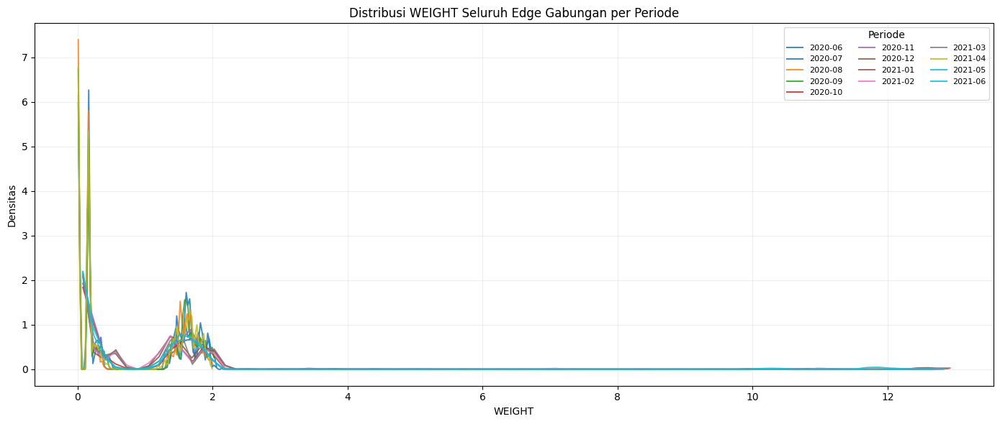

In [32]:
# Visualisasi distribusi WEIGHT semua edge gabungan per periode
fig, ax = plt.subplots(figsize=(14, 6))

color_palette = plt.cm.tab10(np.linspace(0, 1, len(periods)))

for i, period in enumerate(periods):
    # Ambil data semua asset sekaligus untuk periode ini
    data = df_fix[df_fix['YEAR_MONTH'] == period]['WEIGHT'].dropna().values

    if len(data) > 0:
        counts, bins = np.histogram(data, bins=80, density=True)
        bin_centers = (bins[:-1] + bins[1:]) / 2
        ax.plot(bin_centers, counts,
                linewidth=1.4,
                color=color_palette[i],
                alpha=0.85,
                label=str(period))

ax.set_title('Distribusi WEIGHT Seluruh Edge Gabungan per Periode', fontsize=12)
ax.set_xlabel('WEIGHT')
ax.set_ylabel('Densitas')
ax.legend(fontsize=8, ncol=3, loc='upper right', title='Periode')
ax.grid(alpha=0.2)

plt.tight_layout()
plt.show()

# **ISOLATION FOREST**

## **IF Tanpa Window & Eval MA**

### 1. Implementasi IF

In [33]:
from sklearn.ensemble import IsolationForest as IsolationForest

In [34]:
X_weight = df_fix[['WEIGHT']].values
contaminations = [0.01, 0.05, 0.10]

In [35]:
if_tanpawindow = {}

for c in contaminations:
  model_if = IsolationForest(n_estimators=100, contamination=c, random_state=42)
  model_if.fit(X_weight)

  #skor anomali
  raw_scores_if = -model_if.score_samples(X_weight)

  #normalisasi
  scores_if = (raw_scores_if - np.min(raw_scores_if)) / (np.max(raw_scores_if) - np.min(raw_scores_if))
  # scores_if = 1 - scores

  #prediksi
  pred = model_if.predict(X_weight)

  # ubah label: -1 = anomali -> 1 & 1 = normal -> 0
  pred = np.where(pred == -1, 1, 0)

  df_fix[f'IF_SCORE_{c}'] = scores_if
  df_fix[f'LABEL_IF_{c}'] = pred

  if_tanpawindow[c]={
      'model': model_if,
      'scores': scores_if,
      'pred': pred}

In [36]:
df_fix

,DATE_STAMP,ASSET_ID,PRESSURE,PRESSURE_NORM,PRESSURE_ORF,PRESSURE_NORM_ORF,WEIGHT,YEAR_MONTH,IF_SCORE_0.01,LABEL_IF_0.01,IF_SCORE_0.05,LABEL_IF_0.05,IF_SCORE_0.1,LABEL_IF_0.1
0,2020-06-01 00:00:00,Gajah Baru,1.566112e+16,1.407010,1.279108e+16,1.033607,0.373404,2020-06,0.272125,0,0.272125,0,0.272125,0
1,2020-06-01 00:00:00,Kakap,1.551272e+13,-0.628546,1.279108e+16,1.033607,1.662153,2020-06,0.092943,0,0.092943,0,0.092943,0
2,2020-06-01 00:00:00,Hang Tuah,1.500153e+15,-0.435388,1.279108e+16,1.033607,1.468995,2020-06,0.111376,0,0.111376,0,0.111376,0
3,2020-06-01 00:00:00,Anoa,1.555127e+12,-0.630362,1.279108e+16,1.033607,1.663969,2020-06,0.097158,0,0.097158,0,0.097158,0
4,2020-06-01 01:00:00,Gajah Baru,1.563403e+13,-0.628530,1.282924e+16,1.038572,1.667102,2020-06,0.095833,0,0.095833,0,0.095833,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37907,2021-06-30 22:00:00,Kakap,1.481314e+15,-0.437839,1.217497e+16,0.953448,1.391288,2021-06,0.151684,0,0.151684,0,0.151684,0
37908,2021-06-30 23:00:00,Anoa,1.478760e+12,-0.630372,1.218315e+15,-0.472057,0.158315,2021-06,0.017191,0,0.017191,0,0.017191,0
37909,2021-06-30 23:00:00,Gajah Baru,1.493504e+16,1.312544,1.218315e+15,-0.472057,1.784601,2021-06,0.155851,0,0.155851,0,0.155851,0
37910,2021-06-30 23:00:00,Hang Tuah,1.415885e+16,1.211559,1.218315e+15,-0.472057,1.683615,2021-06,0.120885,0,0.120885,0,0.120885,0


In [37]:
summary_if = []

total_data = len(df_fix)

for c in contaminations:

    scores = df_fix[f'IF_SCORE_{c}']

    labels = df_fix[f'LABEL_IF_{c}']

    # threshold
    threshold = np.percentile(
        scores,
        100 * (1 - c)
    )

    # jumlah anomali
    n_anomaly = (labels == 1).sum()

    # persentase
    pct_anomaly = (n_anomaly / total_data) * 100

    # summary
    summary_if.append({
        'Contamination': c,
        'Score Min': scores.min(),
        'Score Max': scores.max(),
        'Threshold': threshold,
        'Jumlah Anomali': n_anomaly,
        'Persentase Anomali (%)': pct_anomaly
    })

# dataframe summary
summary_if = pd.DataFrame(summary_if)

# rapikan angka
summary_if = summary_if.round(4)

summary_if

,Contamination,Score Min,Score Max,Threshold,Jumlah Anomali,Persentase Anomali (%)
0,0.01,0.0,1.0,0.7357,377,0.9944
1,0.05,0.0,1.0,0.4135,1891,4.9879
2,0.10,0.0,1.0,0.2990,3786,9.9863


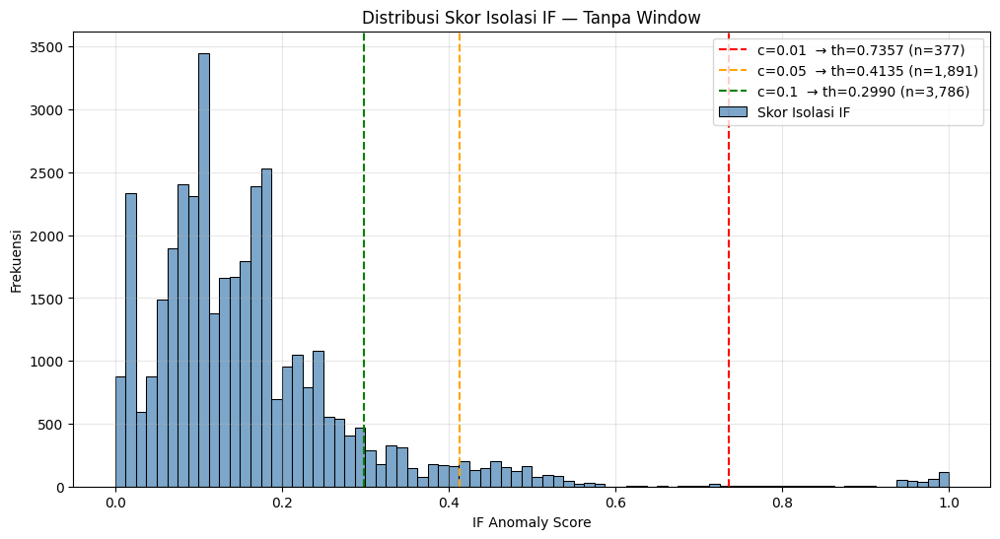

In [38]:
fig, ax = plt.subplots(figsize=(12,6))

# histogram score (gunakan contamination pertama sebagai referensi)
sns.histplot(
    df_fix['IF_SCORE_0.01'],
    bins=80,
    alpha=0.7,
    label='Skor Isolasi IF',
    ax=ax,
    color='steelblue'
)

colors = ['red', 'orange', 'green']

for i, c in enumerate(contaminations):

    scores = df_fix[f'IF_SCORE_{c}']

    # threshold percentile
    threshold = np.percentile(
        scores,
        100 * (1 - c)
    )

    # jumlah anomali
    n_anomaly = (df_fix[f'LABEL_IF_{c}'] == 1).sum()

    # garis threshold
    plt.axvline(
        threshold,
        color=colors[i],
        linestyle='--',
        linewidth=1.5,
        label=f'c={c}  → th={threshold:.4f} (n={n_anomaly:,})'
    )

plt.title('Distribusi Skor Isolasi IF — Tanpa Window')
plt.xlabel('IF Anomaly Score')
plt.ylabel('Frekuensi')

plt.legend()
plt.grid(alpha=0.3)

plt.show()

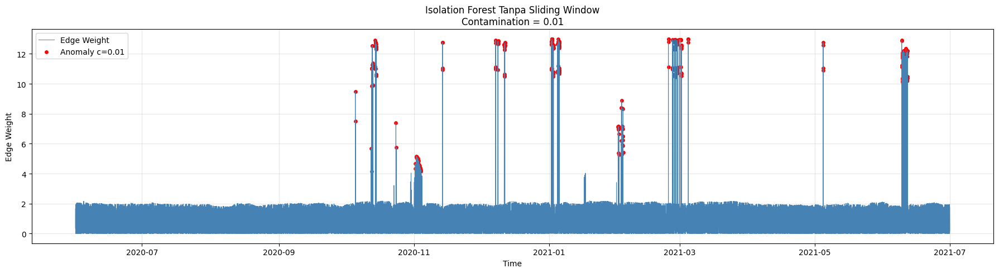

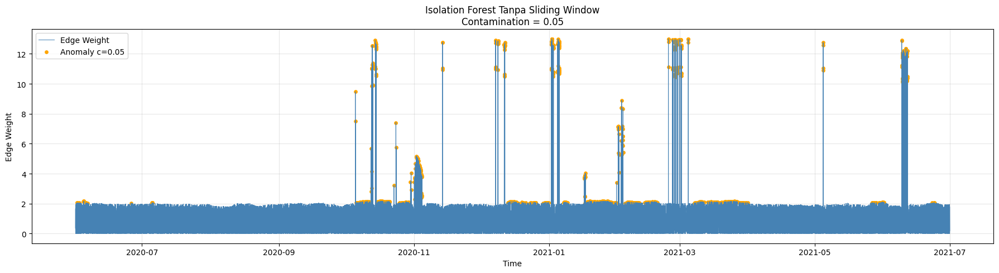

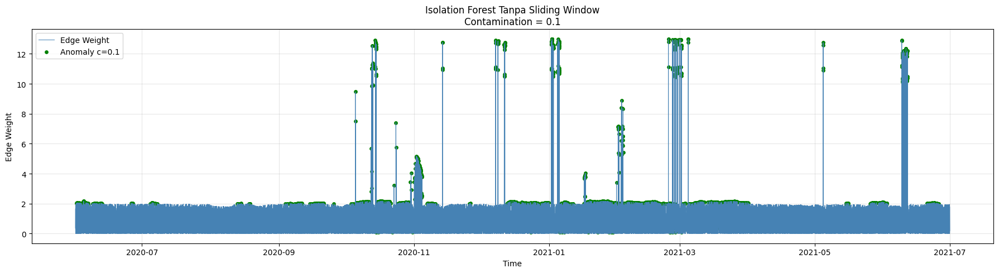

In [39]:
colors_c = {
    0.01: 'red',
    0.05: 'orange',
    0.10: 'green'
}

for c in contaminations:
    plt.figure(figsize=(18,5))

    # line edge weight
    plt.plot(
        df_fix['DATE_STAMP'],
        df_fix['WEIGHT'],
        linewidth=0.7,
        color='steelblue',
        label='Edge Weight')

    # ambil anomaly
    anomaly = df_fix[
        df_fix[f'LABEL_IF_{c}'] == 1
    ]

    # scatter anomaly
    plt.scatter(
        anomaly['DATE_STAMP'],
        anomaly['WEIGHT'],
        color=colors_c[c],
        s=15,
        label=f'Anomaly c={c}'
    )

    plt.title(
        f'Isolation Forest Tanpa Sliding Window\n'
        f'Contamination = {c}'
    )

    plt.xlabel('Time')
    plt.ylabel('Edge Weight')
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

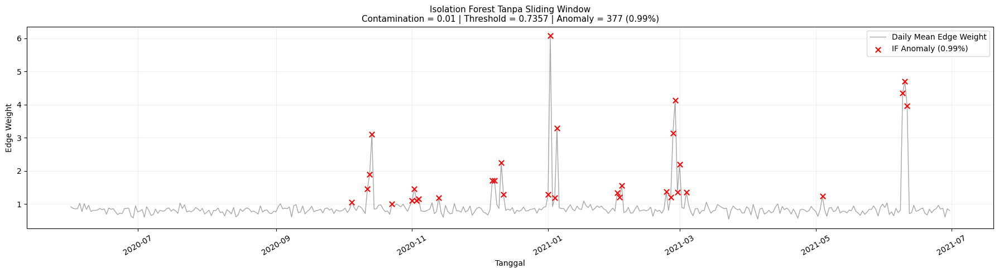

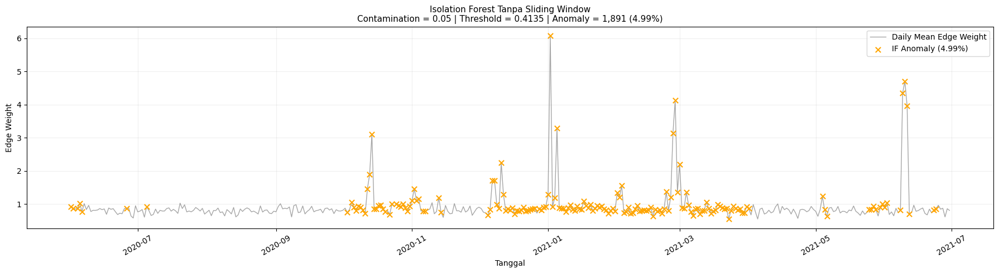

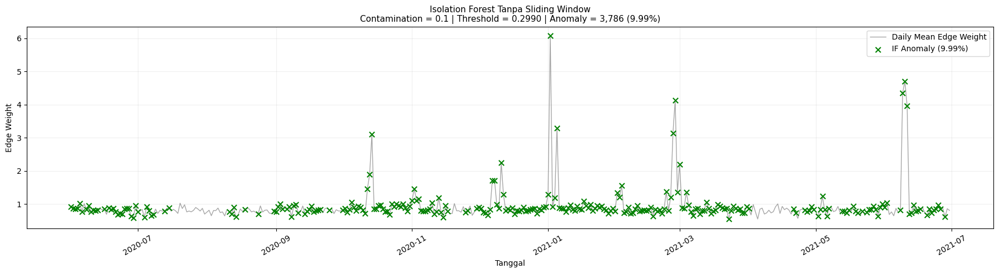

In [40]:
import matplotlib.dates as mdates
import matplotlib.lines as mlines

colors_c = {
    0.01: 'red',
    0.05: 'orange',
    0.10: 'green'
}

for c in contaminations:

    # copy dataframe
    df_viz = df_fix.copy()

    # set datetime index
    df_viz = df_viz.set_index('DATE_STAMP')

    # threshold contamination
    th = np.percentile(
        df_viz[f'IF_SCORE_{c}'],
        100 * (1-c)
    )

    # total anomaly hourly
    total_hourly = len(df_viz)

    total_anomaly = int(
        df_viz[f'LABEL_IF_{c}'].sum()
    )

    pct_anomaly = (
        total_anomaly / total_hourly
    ) * 100

    # ======================================================
    # RESAMPLE HARIAN
    # ======================================================

    # rata-rata harian
    daily_weight = (
        df_viz['WEIGHT']
        .resample('D')
        .mean()
    )

    # jika dalam 1 hari ada anomaly,
    # maka hari itu dianggap anomaly
    daily_if = (
        df_viz[f'LABEL_IF_{c}']
        .resample('D')
        .max()
    )

    # hapus NaN
    valid = daily_weight.notna()

    daily_weight = daily_weight[valid]
    daily_if = daily_if[valid]

    # ======================================================
    # VISUALISASI
    # ======================================================

    plt.figure(figsize=(18,5))

    # garis harian
    plt.plot(
        daily_weight.index,
        daily_weight.values,
        color='gray',
        linewidth=1,
        alpha=0.7,
        label='Daily Mean Edge Weight'
    )

    # titik anomaly harian
    idx_if = daily_if[daily_if == 1].index

    plt.scatter(
        idx_if,
        daily_weight.loc[idx_if],
        color=colors_c[c],
        marker='x',
        s=45,
        linewidths=1.5,
        zorder=5,
        label=f'IF Anomaly ({pct_anomaly:.2f}%)'
    )

    # ======================================================
    # TITLE & FORMAT
    # ======================================================

    plt.title(
        f'Isolation Forest Tanpa Sliding Window'
        f'\nContamination = {c} | '
        f'Threshold = {th:.4f} | '
        f'Anomaly = {total_anomaly:,} '
        f'({pct_anomaly:.2f}%)',
        fontsize=11
    )

    plt.xlabel('Tanggal')
    plt.ylabel('Edge Weight')

    plt.grid(alpha=0.2)

    plt.legend(loc='upper right')

    plt.gca().xaxis.set_major_formatter(
        mdates.DateFormatter('%Y-%m')
    )

    plt.xticks(rotation=30)

    plt.tight_layout()

    plt.show()

### 2. Labelling MA

In [73]:
def label_ma(series, window, k):
    mean_roll = series.rolling(window=window, min_periods=window).mean()
    std_roll  = series.rolling(window=window, min_periods=window).std()
    deviasi     = np.abs(series - mean_roll)
    label       = (deviasi > k * std_roll).fillna(False).astype(int)
    return label, mean_roll, std_roll

In [118]:
K_MA = 2
window_ma = [12, 24]

ma_results = {}   # simpan info untuk visualisasi
df_ma_list = []

for window in window_ma:
    ma_info = {}

    for asset in sorted(df_fix['ASSET_ID'].unique()):
        df_a   = (df_fix[df_fix['ASSET_ID'] == asset].sort_values('DATE_STAMP').reset_index(drop=True))
        series = pd.Series(df_a['WEIGHT'].values)
        times  = df_a['DATE_STAMP'].values

        lbl_ma, mean_roll, std_roll = label_ma(series, window, K_MA)

        # Batas atas dan bawah (garis horisontal)
        upper = mean_roll + K_MA * std_roll
        lower = mean_roll - K_MA * std_roll

        ma_info[asset] = {
            'times'   : times,
            'weight'  : series.values,
            'lbl_ma'  : lbl_ma.values,
            'mean'    : mean_roll.values,       # skalar — garis horizontal
            'upper'   : upper.values,           # skalar
            'lower'   : lower.values,           # skalar
        }

        # Simpan Dataframe
        for i in range(len(times)):
            df_ma_list.append({
                'DATE_STAMP' : times[i],
                'ASSET_ID'   : asset,
                'EDGE'       : f'{asset}->ORF',
                'WEIGHT'     : series.values[i],
                'WINDOW_MA'  : window,
                'MEAN_ROLL'  : mean_roll.values[i],
                'STD_ROLL'   : std_roll.values[i],
                'UPPER'      : upper.values[i],
                'LOWER'      : lower.values[i],
                'LABEL_MA'   : lbl_ma.values[i]})

        # ringkasan
        n_a = int(lbl_ma.sum())
        pct = 100 * n_a / len(lbl_ma)
        print(f'{asset:<12} | '
              f'N Anomali : {n_a:>6,} | '
              f'% Anomali : {pct:>6.2f}%')

    # Ringkasan per window
    all_labels = np.concatenate([ma_info[a]['lbl_ma']
                                  for a in ma_info])
    n_total_w = len(all_labels)
    n_anom_w = int(all_labels.sum())

    print('-' * 46)
    print(f'{"Total":<12} | {n_total_w:>8,} | '
          f'{n_anom_w:>10,} | '
          f'{100*n_anom_w/n_total_w:>9.2f}%')

    ma_results[window] = {'info_asset': ma_info}

Anoa         | N Anomali :    178 | % Anomali :   1.88%
Gajah Baru   | N Anomali :     90 | % Anomali :   0.95%
Hang Tuah    | N Anomali :     74 | % Anomali :   0.78%
Kakap        | N Anomali :    115 | % Anomali :   1.21%
----------------------------------------------
Total        |   37,912 |        457 |      1.21%
Anoa         | N Anomali :     75 | % Anomali :   0.79%
Gajah Baru   | N Anomali :     56 | % Anomali :   0.59%
Hang Tuah    | N Anomali :     57 | % Anomali :   0.60%
Kakap        | N Anomali :    101 | % Anomali :   1.07%
----------------------------------------------
Total        |   37,912 |        289 |      0.76%


In [119]:
# ── Buat DataFrame ────────────────────────────────────────────
df_ma = pd.DataFrame(df_ma_list)

print(f'\nShape : {df_ma.shape}')
df_ma


Shape : (75824, 10)


,DATE_STAMP,ASSET_ID,EDGE,WEIGHT,WINDOW_MA,MEAN_ROLL,STD_ROLL,UPPER,LOWER,LABEL_MA
0,2020-06-01 00:00:00,Anoa,Anoa->ORF,1.663969,12,NaN,NaN,NaN,NaN,0
1,2020-06-01 01:00:00,Anoa,Anoa->ORF,1.669116,12,NaN,NaN,NaN,NaN,0
2,2020-06-01 02:00:00,Anoa,Anoa->ORF,0.001477,12,NaN,NaN,NaN,NaN,0
3,2020-06-01 03:00:00,Anoa,Anoa->ORF,1.684386,12,NaN,NaN,NaN,NaN,0
4,2020-06-01 04:00:00,Anoa,Anoa->ORF,0.016869,12,NaN,NaN,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...
75819,2021-06-30 19:00:00,Kakap,Kakap->ORF,0.177227,24,0.825460,0.789175,2.403811,-0.752891,0
75820,2021-06-30 20:00:00,Kakap,Kakap->ORF,0.139327,24,0.767591,0.786321,2.340234,-0.805052,0
75821,2021-06-30 21:00:00,Kakap,Kakap->ORF,0.192779,24,0.695902,0.755137,2.206175,-0.814371,0
75822,2021-06-30 22:00:00,Kakap,Kakap->ORF,1.391288,24,0.680567,0.736099,2.152764,-0.791631,0


In [120]:
df_ma.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75824 entries, 0 to 75823
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   DATE_STAMP  75824 non-null  datetime64[ns]
 1   ASSET_ID    75824 non-null  object        
 2   EDGE        75824 non-null  object        
 3   WEIGHT      75824 non-null  float64       
 4   WINDOW_MA   75824 non-null  int64         
 5   MEAN_ROLL   75688 non-null  float64       
 6   STD_ROLL    75688 non-null  float64       
 7   UPPER       75688 non-null  float64       
 8   LOWER       75688 non-null  float64       
 9   LABEL_MA    75824 non-null  int64         
dtypes: datetime64[ns](1), float64(5), int64(2), object(2)
memory usage: 5.8+ MB


In [121]:
# ── Pivot: ringkasan per window × asset ──────────────────────

print('=== N Anomali per Asset × Window ===')
pivot_n = df_ma.groupby(['ASSET_ID', 'WINDOW_MA'])['LABEL_MA'].sum().unstack('WINDOW_MA')
pivot_n.columns = [f'w={c}' for c in pivot_n.columns]
print(pivot_n.to_string())

print('\n=== % Anomali per Asset × Window ===')
pivot_pct = df_ma.groupby(['ASSET_ID', 'WINDOW_MA']).apply(
    lambda x: round(100 * x['LABEL_MA'].sum() / len(x), 2)
).unstack('WINDOW_MA')
pivot_pct.columns = [f'w={c}' for c in pivot_pct.columns]
print(pivot_pct.to_string())

=== N Anomali per Asset × Window ===
            w=12  w=24
ASSET_ID              
Anoa         178    75
Gajah Baru    90    56
Hang Tuah     74    57
Kakap        115   101

=== % Anomali per Asset × Window ===
            w=12  w=24
ASSET_ID              
Anoa        1.88  0.79
Gajah Baru  0.95  0.59
Hang Tuah   0.78  0.60
Kakap       1.21  1.07


/tmp/ipykernel_3431/1858793688.py:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  pivot_pct = df_ma.groupby(['ASSET_ID', 'WINDOW_MA']).apply(


### 3. Evaluasi

In [122]:
from sklearn.metrics import precision_score, recall_score, f1_score

rekap_eval_tanpawindow = []

for window in window_ma:
  # ambil label MA sesuai window
  df_ma_w = (df_ma[df_ma['WINDOW_MA'] == window]
            [['DATE_STAMP', 'ASSET_ID', 'LABEL_MA']].copy())

  cols_if = (['DATE_STAMP', 'ASSET_ID', 'WEIGHT']
             + [f'IF_SCORE_{c}' for c in contaminations]
             + [f'LABEL_IF_{c}' for c in contaminations])

  # merge dengan hasil IF
  df_eval_merge = (df_fix.merge(df_ma_w,
                  on=['DATE_STAMP', 'ASSET_ID'], how='inner'))
  y_ma = df_eval_merge['LABEL_MA'].values

  for c in contaminations:
    y_if = df_eval_merge[f'LABEL_IF_{c}'].values
    scores_if = df_eval_merge[f'IF_SCORE_{c}'].values
    th = np.percentile(scores_if, 100 * (1 - c))

    tp = int(((y_if == 1) & (y_ma == 1)).sum())
    fp = int(((y_if == 1) & (y_ma == 0)).sum())
    fn = int(((y_if == 0) & (y_ma == 1)).sum())
    tn = int(((y_if == 0) & (y_ma == 0)).sum())

    # persentase
    pct_if = 100 * int(y_if.sum()) / len(y_if)
    pct_ma = 100 * int(y_ma.sum()) / len(y_ma)

    rekap_eval_tanpawindow.append({
        'Window MA'    : window,
        'Contamination': c,
        'Threshold IF' : round(th, 4),
        'N Label IF'   : int(y_if.sum()),
        'N Label MA'   : int(y_ma.sum()),
        'TP': tp, 'FP': fp, 'FN': fn, 'TN': tn,
        'Precision'    : round(precision_score(y_ma, y_if, zero_division=0), 4),
        'Recall'       : round(recall_score(y_ma, y_if, zero_division=0), 4),
        'F1-Score'     : round(f1_score(y_ma, y_if, zero_division=0), 4),
    })

df_eval_tanpawindow = pd.DataFrame(rekap_eval_tanpawindow)
print('=== Konsistensi Label IF Terhadap MA ===')
df_eval_tanpawindow

=== Konsistensi Label IF Terhadap MA ===


,Window MA,Contamination,Threshold IF,N Label IF,N Label MA,TP,FP,FN,TN,Precision,Recall,F1-Score
0,12,0.01,0.7357,377,457,118,259,339,37196,0.3130,0.2582,0.2830
1,12,0.05,0.4135,1891,457,136,1755,321,35700,0.0719,0.2976,0.1158
2,12,0.10,0.2990,3786,457,145,3641,312,33814,0.0383,0.3173,0.0683
3,24,0.01,0.7357,377,289,167,210,122,37413,0.4430,0.5779,0.5015
4,24,0.05,0.4135,1891,289,190,1701,99,35922,0.1005,0.6574,0.1743
5,24,0.10,0.2990,3786,289,200,3586,89,34037,0.0528,0.6920,0.0982


Semakin besar kontaminasi pada metode IF maka semakin banyak jumlah data yang dianggap anomali.

**Window MA = 12**
Jumlah anomalinya 457 data


In [123]:
import matplotlib.dates as mdates
import matplotlib.lines as mlines

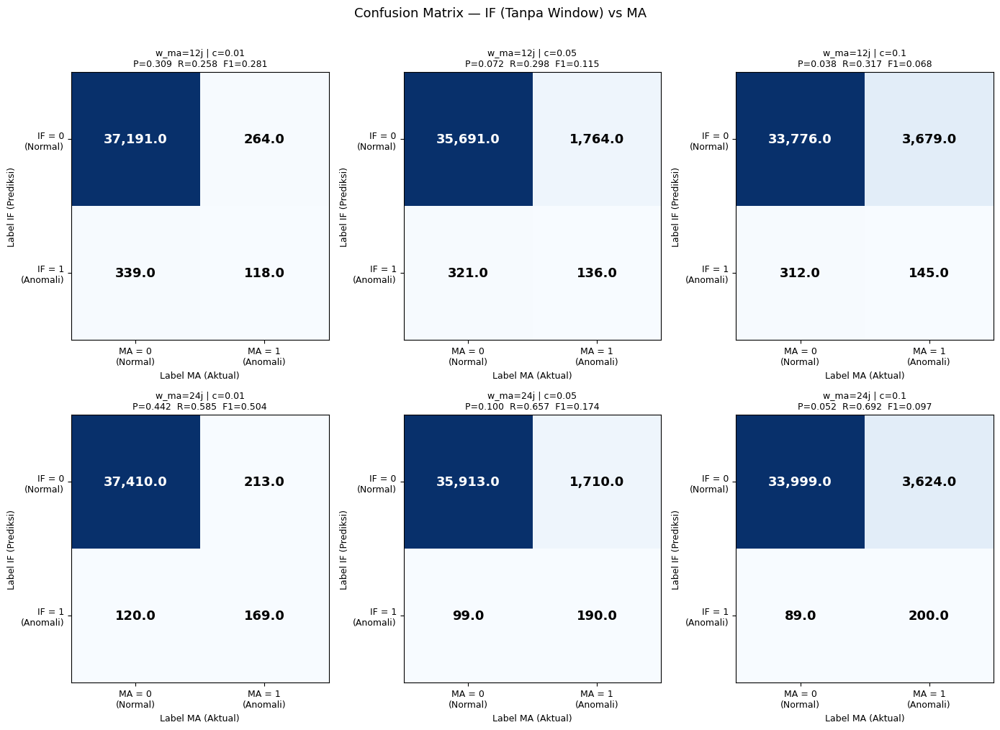

In [124]:
fig, axes = plt.subplots(len(window_ma), len(contaminations),
                          figsize=(14, 5 * len(window_ma)))

for row, window in enumerate(window_ma):
    for col, c in enumerate(contaminations):
        ax       = axes[row, col]
        row_data = df_eval[
            (df_eval['Window MA']     == window) &
            (df_eval['Contamination'] == c)
        ].iloc[0]

        cm_vals = np.array([
            [row_data['TN'], row_data['FP']],
            [row_data['FN'], row_data['TP']]
        ])

        ax.imshow(cm_vals, cmap='Blues', aspect='auto')

        for i in range(2):
            for j in range(2):
                val = cm_vals[i, j]
                ax.text(j, i, f'{val:,}',
                        ha='center', va='center',
                        fontsize=13, fontweight='bold',
                        color='white' if val > cm_vals.max() * 0.5 else 'black')

        ax.set_xticks([0, 1])
        ax.set_yticks([0, 1])
        ax.set_xticklabels(['MA = 0\n(Normal)', 'MA = 1\n(Anomali)'], fontsize=9)
        ax.set_yticklabels(['IF = 0\n(Normal)', 'IF = 1\n(Anomali)'], fontsize=9)
        ax.set_xlabel('Label MA (Aktual)', fontsize=9)
        ax.set_ylabel('Label IF (Prediksi)', fontsize=9)
        ax.set_title(
            f'w_ma={window}j | c={c}\n'
            f'P={row_data["Precision"]:.3f}  '
            f'R={row_data["Recall"]:.3f}  '
            f'F1={row_data["F1-Score"]:.3f}',
            fontsize=9
        )

plt.suptitle('Confusion Matrix — IF (Tanpa Window) vs MA', fontsize=13, y=1.01)
plt.tight_layout()
plt.show()

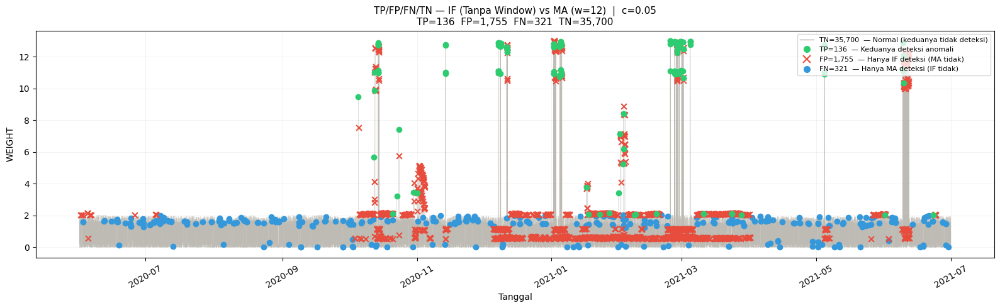

In [125]:
# ============================================================
# VISUALISASI 2: TP FP FN pada TIME SERIES — w=12, c=0.05
# Ganti window_viz dan c_viz sesuai kebutuhan
# ============================================================
window_viz = 12
c_viz      = 0.05

warna = {
    'TP': '#2ecc71',  # hijau  — IF & MA sama-sama deteksi anomali
    'FP': '#e74c3c',  # merah  — hanya IF yang deteksi
    'FN': '#3498db',  # biru   — hanya MA yang deteksi
    'TN': '#B4B2A9',  # abu    — keduanya normal
}

# Ambil label MA sesuai window_viz
df_ma_w = (df_ma[df_ma['WINDOW_MA'] == window_viz]
           [['DATE_STAMP', 'ASSET_ID', 'LABEL_MA']]
           .copy())

# Merge dengan df_fix — gunakan LABEL_IF_{c_viz} yang sudah ada
df_viz = (df_fix[['DATE_STAMP', 'ASSET_ID', 'WEIGHT', f'LABEL_IF_{c_viz}']]
          .merge(df_ma_w, on=['DATE_STAMP', 'ASSET_ID'], how='inner')
          .rename(columns={f'LABEL_IF_{c_viz}': 'LABEL_IF'}))

# Kategorisasi per baris
def get_kategori(row):
    if   row['LABEL_IF'] == 1 and row['LABEL_MA'] == 1: return 'TP'
    elif row['LABEL_IF'] == 1 and row['LABEL_MA'] == 0: return 'FP'
    elif row['LABEL_IF'] == 0 and row['LABEL_MA'] == 1: return 'FN'
    else:                                                return 'TN'

df_viz['KATEGORI'] = df_viz.apply(get_kategori, axis=1)

n_tp = (df_viz['KATEGORI'] == 'TP').sum()
n_fp = (df_viz['KATEGORI'] == 'FP').sum()
n_fn = (df_viz['KATEGORI'] == 'FN').sum()
n_tn = (df_viz['KATEGORI'] == 'TN').sum()

fig, ax = plt.subplots(figsize=(16, 5))

# Garis abu-abu: semua edge
for asset in sorted(df_viz['ASSET_ID'].unique()):
    df_a = df_viz[df_viz['ASSET_ID'] == asset]
    ax.plot(df_a['DATE_STAMP'], df_a['WEIGHT'],
            color='#B4B2A9', linewidth=0.5, alpha=0.4, zorder=1)

# Plot per kategori (kecuali TN agar tidak terlalu padat)
for kat in ['FN', 'FP', 'TP']:
    df_k   = df_viz[df_viz['KATEGORI'] == kat]
    marker = 'o' if kat in ['TP', 'FN'] else 'x'
    size   = 30  if kat in ['TP', 'FN'] else 40
    ax.scatter(df_k['DATE_STAMP'], df_k['WEIGHT'],
               color=warna[kat], marker=marker, s=size,
               linewidths=1.5, zorder=5, label=kat)

legend_handles = [
    mlines.Line2D([], [], color='#B4B2A9', linewidth=1,
                  label=f'TN={n_tn:,}  — Normal (keduanya tidak deteksi)'),
    mlines.Line2D([], [], color=warna['TP'], marker='o',
                  linestyle='None', markersize=7,
                  label=f'TP={n_tp:,}  — Keduanya deteksi anomali'),
    mlines.Line2D([], [], color=warna['FP'], marker='x',
                  linestyle='None', markersize=8, markeredgewidth=1.5,
                  label=f'FP={n_fp:,}  — Hanya IF deteksi (MA tidak)'),
    mlines.Line2D([], [], color=warna['FN'], marker='o',
                  linestyle='None', markersize=7,
                  label=f'FN={n_fn:,}  — Hanya MA deteksi (IF tidak)'),
]
ax.legend(handles=legend_handles, fontsize=8, loc='upper right')

ax.set_title(
    f'TP/FP/FN/TN — IF (Tanpa Window) vs MA (w={window_viz})  |  c={c_viz}\n'
    f'TP={n_tp:,}  FP={n_fp:,}  FN={n_fn:,}  TN={n_tn:,}',
    fontsize=11
)
ax.set_xlabel('Tanggal', fontsize=10)
ax.set_ylabel('WEIGHT', fontsize=10)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
ax.tick_params(axis='x', rotation=30)
ax.grid(alpha=0.15)
plt.tight_layout()
plt.show()

### 4. Visualisasi

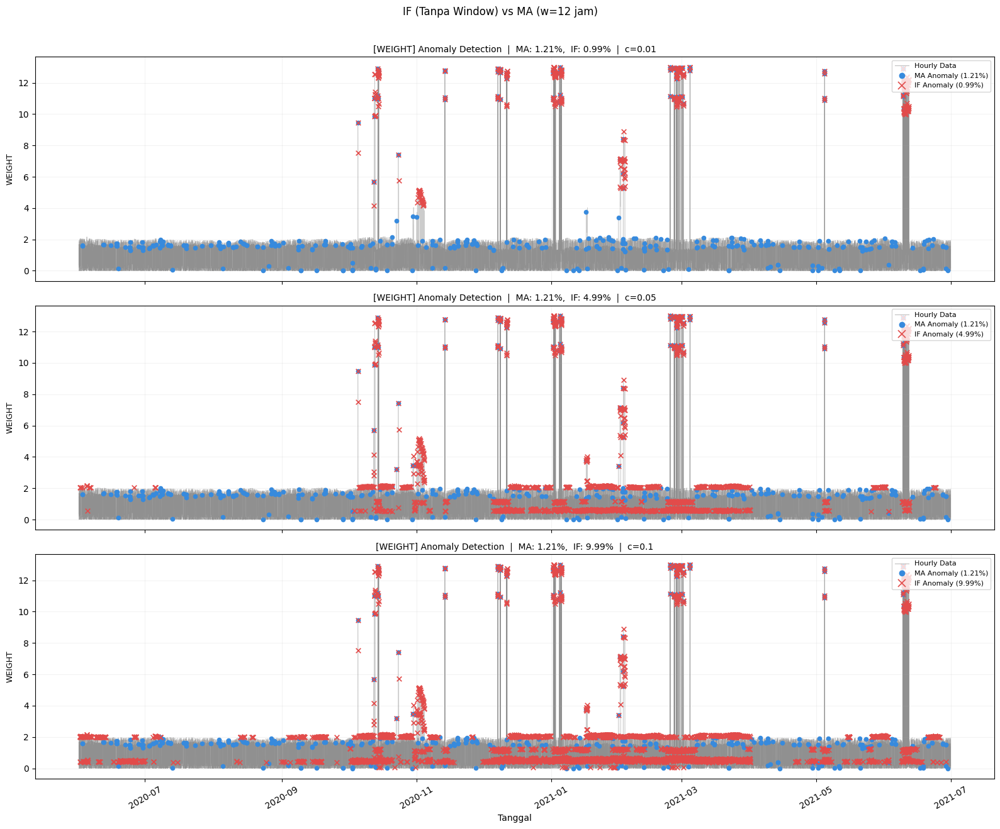

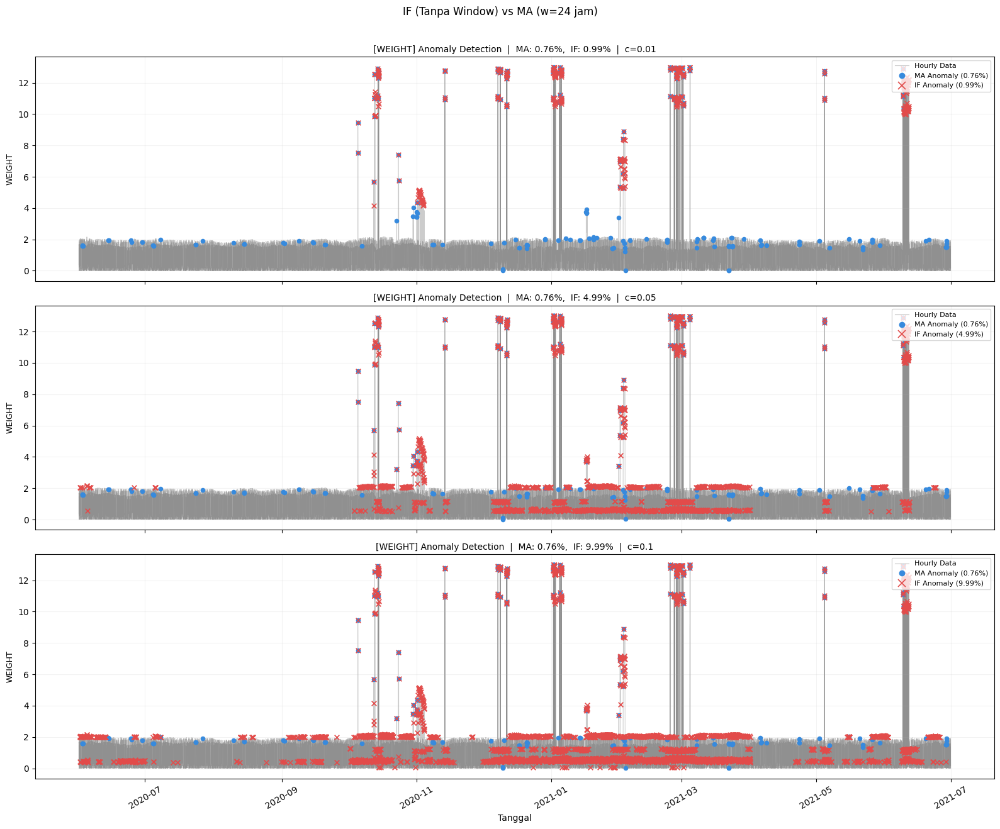

In [126]:
for window in window_ma:

    df_ma_w = (df_ma[df_ma['WINDOW_MA'] == window]
               [['DATE_STAMP', 'ASSET_ID', 'LABEL_MA']]
               .copy())

    cols_viz = (['DATE_STAMP', 'ASSET_ID', 'WEIGHT']
                + [f'LABEL_IF_{c}' for c in contaminations])

    df_viz = (df_fix[cols_viz]
              .merge(df_ma_w, on=['DATE_STAMP', 'ASSET_ID'], how='inner'))

    fig, axes = plt.subplots(3, 1, figsize=(16, 13), sharex=True)

    for ax, c in zip(axes, contaminations):

        total_jam = len(df_viz)
        n_if_jam  = int(df_viz[f'LABEL_IF_{c}'].sum())
        n_ma_jam  = int(df_viz['LABEL_MA'].sum())
        pct_if    = 100 * n_if_jam / total_jam
        pct_ma    = 100 * n_ma_jam / total_jam

        first_asset = True

        for asset in sorted(df_viz['ASSET_ID'].unique()):
            df_a   = (df_viz[df_viz['ASSET_ID'] == asset]
                      .sort_values('DATE_STAMP'))

            times  = df_a['DATE_STAMP'].values
            weight = df_a['WEIGHT'].values
            lbl_if = df_a[f'LABEL_IF_{c}'].values
            lbl_ma = df_a['LABEL_MA'].values

            # Garis abu-abu: data asli per jam
            ax.plot(times, weight,
                    color='gray', linewidth=0.5, alpha=0.4, zorder=1)

            # Titik biru (●): jam yang anomali MA
            mask_ma = lbl_ma == 1
            ax.scatter(times[mask_ma], weight[mask_ma],
                       color='#378ADD', marker='o', s=20, zorder=4,
                       label='MA Anomaly' if first_asset else '')

            # Tanda silang merah (×): jam yang anomali IF
            mask_if = lbl_if == 1
            ax.scatter(times[mask_if], weight[mask_if],
                       color='#E24B4A', marker='x', s=30, zorder=5,
                       linewidths=1.2,
                       label='IF Anomaly' if first_asset else '')

            first_asset = False

        legend_handles = [
            mlines.Line2D([], [], color='gray', linewidth=0.8,
                          alpha=0.5, label='Hourly Data'),
            mlines.Line2D([], [], color='#378ADD', marker='o',
                          linestyle='None', markersize=6,
                          label=f'MA Anomaly ({pct_ma:.2f}%)'),
            mlines.Line2D([], [], color='#E24B4A', marker='x',
                          linestyle='None', markersize=8, markeredgewidth=1.2,
                          label=f'IF Anomaly ({pct_if:.2f}%)'),
        ]
        ax.legend(handles=legend_handles, fontsize=8, loc='upper right')
        ax.set_title(
            f'[WEIGHT] Anomaly Detection  |  '
            f'MA: {pct_ma:.2f}%,  IF: {pct_if:.2f}%  |  c={c}',
            fontsize=10
        )
        ax.set_ylabel('WEIGHT', fontsize=9)
        ax.grid(alpha=0.15)
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
        ax.tick_params(axis='x', rotation=30)

    axes[-1].set_xlabel('Tanggal', fontsize=10)
    plt.suptitle(
        f'IF (Tanpa Window) vs MA (w={window} jam)',
        fontsize=12, y=1.01
    )
    plt.tight_layout()
    plt.show()

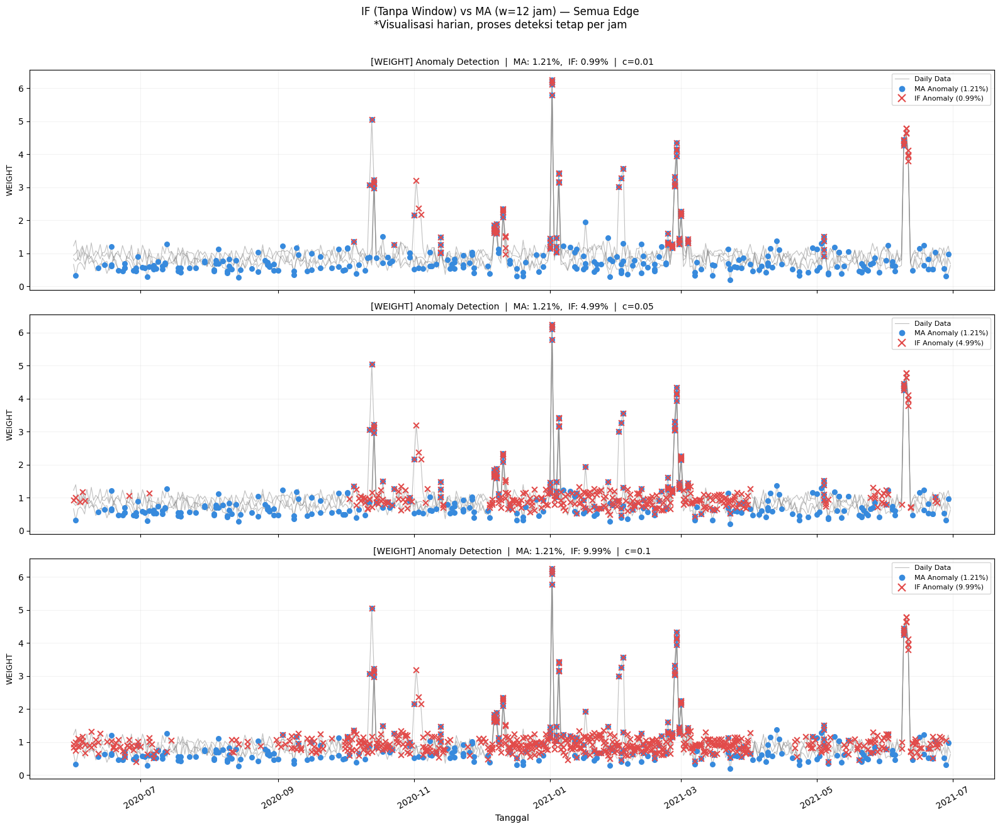

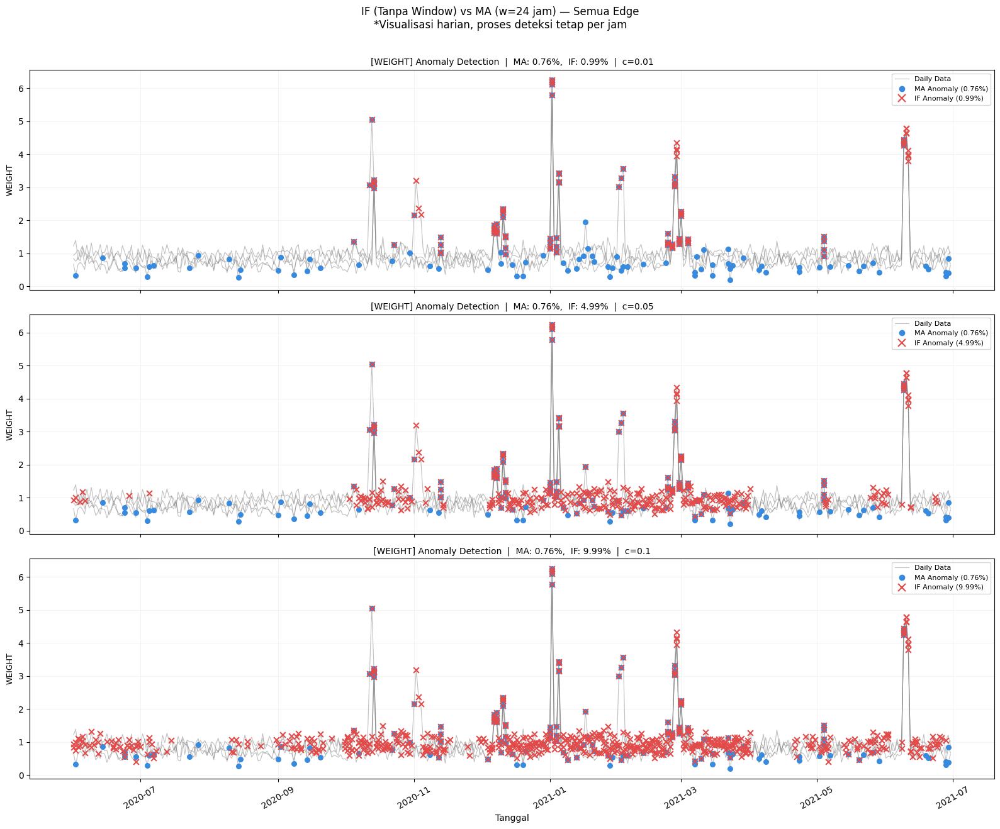

In [127]:
# VISUALISASI HARIAN: IF vs MA — SEMUA EDGE
for window in window_ma:

    df_ma_w = (df_ma[df_ma['WINDOW_MA'] == window]
               [['DATE_STAMP', 'ASSET_ID', 'LABEL_MA']]
               .copy())

    # Kolom yang dibutuhkan: WEIGHT + semua LABEL_IF_{c}
    cols_viz = (['DATE_STAMP', 'ASSET_ID', 'WEIGHT']
                + [f'LABEL_IF_{c}' for c in contaminations])

    df_viz = (df_fix[cols_viz]
              .merge(df_ma_w, on=['DATE_STAMP', 'ASSET_ID'], how='inner'))

    fig, axes = plt.subplots(3, 1, figsize=(16, 13), sharex=True)

    for ax, c in zip(axes, contaminations):

        total_jam = len(df_viz)
        n_if_jam  = int(df_viz[f'LABEL_IF_{c}'].sum())
        n_ma_jam  = int(df_viz['LABEL_MA'].sum())
        pct_if    = 100 * n_if_jam / total_jam
        pct_ma    = 100 * n_ma_jam / total_jam

        first_asset = True

        for asset in sorted(df_viz['ASSET_ID'].unique()):
            df_a = (df_viz[df_viz['ASSET_ID'] == asset]
                    .set_index('DATE_STAMP'))

            # Resample ke harian — hanya untuk visualisasi
            daily_weight = df_a['WEIGHT'].resample('D').mean()
            daily_if     = df_a[f'LABEL_IF_{c}'].resample('D').max()
            daily_ma     = df_a['LABEL_MA'].resample('D').max()

            valid        = daily_weight.notna()
            daily_weight = daily_weight[valid]
            daily_if     = daily_if[valid]
            daily_ma     = daily_ma[valid]

            # Garis abu-abu: data harian
            ax.plot(daily_weight.index, daily_weight.values,
                    color='gray', linewidth=0.8, alpha=0.5, zorder=1)

            # Titik biru (●): hari anomali MA
            idx_ma = daily_ma[daily_ma == 1].index
            ax.scatter(idx_ma, daily_weight.loc[idx_ma],
                       color='#378ADD', marker='o', s=30, zorder=4,
                       label='MA Anomaly' if first_asset else '')

            # Tanda silang merah (×): hari anomali IF
            idx_if = daily_if[daily_if == 1].index
            ax.scatter(idx_if, daily_weight.loc[idx_if],
                       color='#E24B4A', marker='x', s=40, zorder=5,
                       linewidths=1.5,
                       label='IF Anomaly' if first_asset else '')

            first_asset = False

        legend_handles = [
            mlines.Line2D([], [], color='gray', linewidth=0.8,
                          alpha=0.5, label='Daily Data'),
            mlines.Line2D([], [], color='#378ADD', marker='o',
                          linestyle='None', markersize=6,
                          label=f'MA Anomaly ({pct_ma:.2f}%)'),
            mlines.Line2D([], [], color='#E24B4A', marker='x',
                          linestyle='None', markersize=8, markeredgewidth=1.5,
                          label=f'IF Anomaly ({pct_if:.2f}%)'),
        ]
        ax.legend(handles=legend_handles, fontsize=8, loc='upper right')
        ax.set_title(
            f'[WEIGHT] Anomaly Detection  |  '
            f'MA: {pct_ma:.2f}%,  IF: {pct_if:.2f}%  |  c={c}',
            fontsize=10
        )
        ax.set_ylabel('WEIGHT', fontsize=9)
        ax.grid(alpha=0.15)
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
        ax.tick_params(axis='x', rotation=30)

    axes[-1].set_xlabel('Tanggal', fontsize=10)
    plt.suptitle(
        f'IF (Tanpa Window) vs MA (w={window} jam) — Semua Edge\n'
        f'*Visualisasi harian, proses deteksi tetap per jam',
        fontsize=12, y=1.01
    )
    plt.tight_layout()
    plt.show()

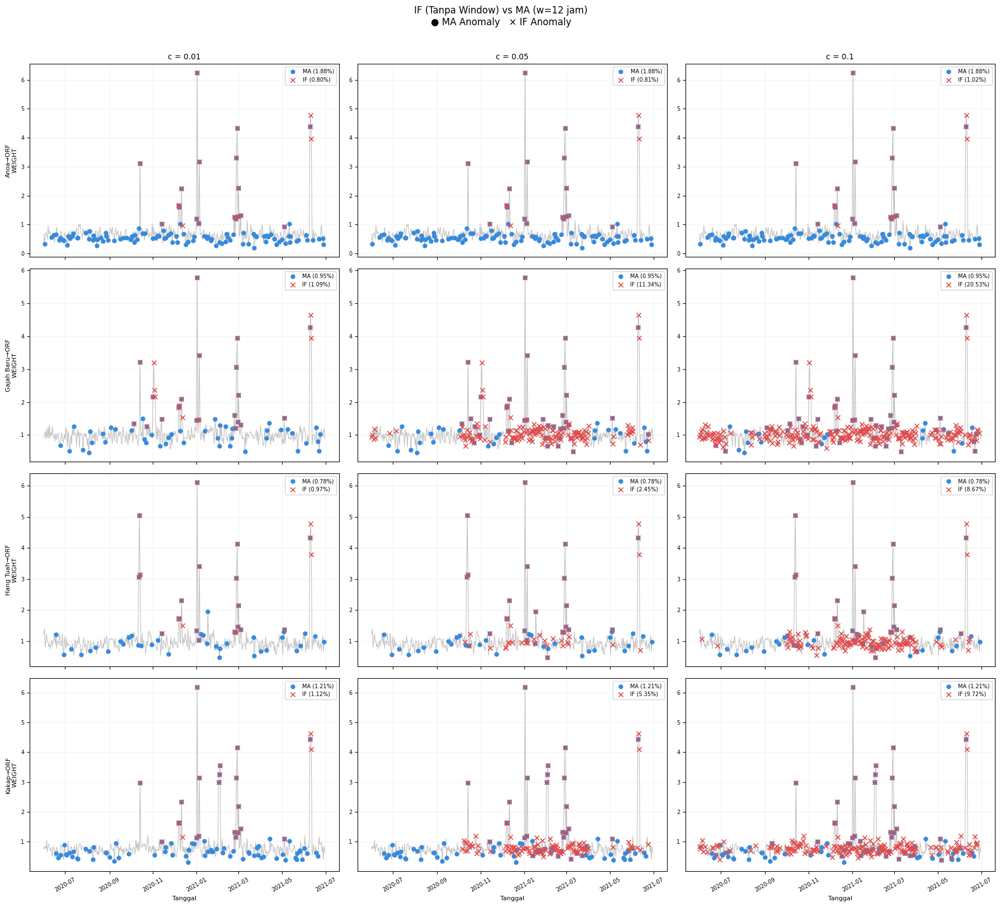

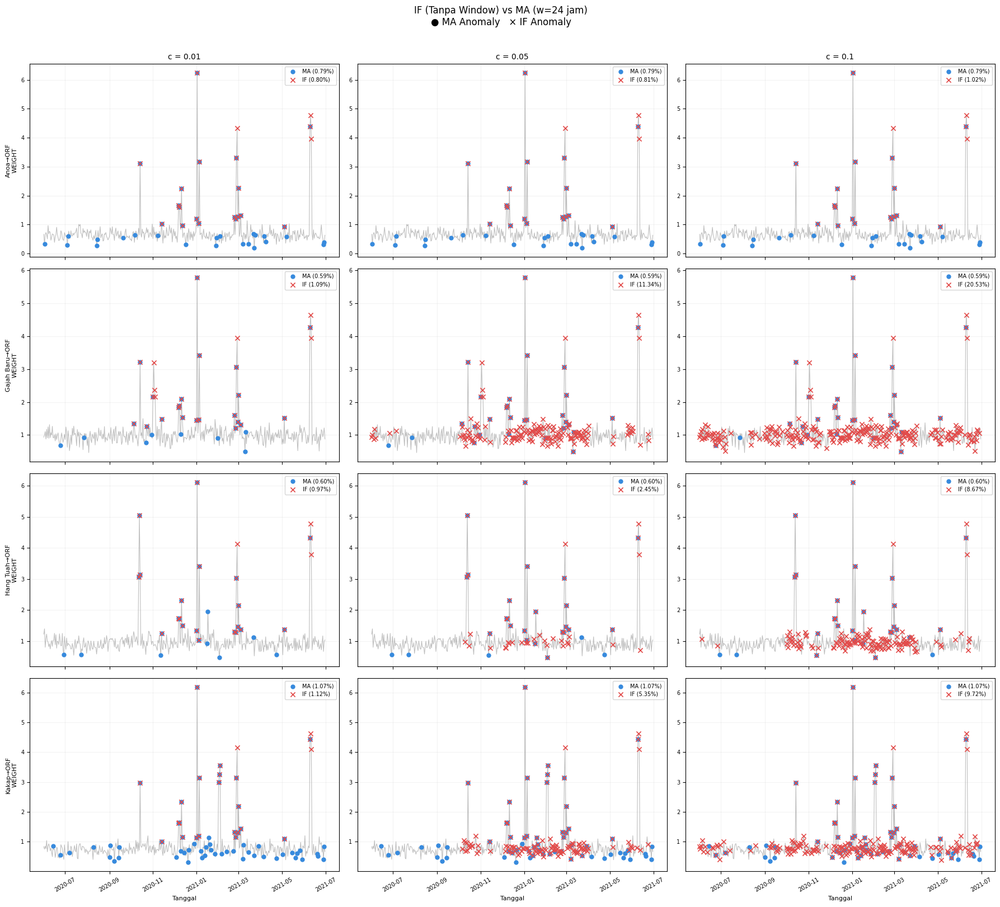

In [128]:
# ─────────────────────────────────────────────────────────────
# VISUALISASI HARIAN PER ASSET × CONTAMINATION
#    Grid: baris=asset, kolom=contamination
# ─────────────────────────────────────────────────────────────

for window in window_ma:

    df_ma_w = (df_ma[df_ma['WINDOW_MA'] == window]
               [['DATE_STAMP', 'ASSET_ID', 'LABEL_MA']]
               .copy())

    cols_viz = (['DATE_STAMP', 'ASSET_ID', 'WEIGHT']
                + [f'LABEL_IF_{c}' for c in contaminations])

    df_viz = (df_fix[cols_viz]
              .merge(df_ma_w, on=['DATE_STAMP', 'ASSET_ID'], how='inner')
              .sort_values(['ASSET_ID', 'DATE_STAMP'])
              .reset_index(drop=True))

    assets = sorted(df_viz['ASSET_ID'].unique())

    fig, axes = plt.subplots(len(assets), len(contaminations),
                              figsize=(18, 4 * len(assets)),
                              sharex=True)

    for row, asset in enumerate(assets):
        df_a   = (df_viz[df_viz['ASSET_ID'] == asset]
                  .sort_values('DATE_STAMP')
                  .reset_index(drop=True))

        times  = df_a['DATE_STAMP'].values
        weight = df_a['WEIGHT'].values
        lbl_ma = df_a['LABEL_MA'].values

        for col, c in enumerate(contaminations):
            ax     = axes[row, col]
            lbl_if = df_a[f'LABEL_IF_{c}'].values

            pct_if = 100 * lbl_if.sum() / len(lbl_if)
            pct_ma = 100 * lbl_ma.sum() / len(lbl_ma)

            # Resample ke harian (hanya visualisasi)
            df_temp = pd.DataFrame({
                'WEIGHT'  : weight,
                'LABEL_IF': lbl_if,
                'LABEL_MA': lbl_ma
            }, index=pd.DatetimeIndex(times))

            daily_weight = df_temp['WEIGHT'].resample('D').mean()
            daily_if     = df_temp['LABEL_IF'].resample('D').max()
            daily_ma     = df_temp['LABEL_MA'].resample('D').max()

            valid        = daily_weight.notna()
            daily_weight = daily_weight[valid]
            daily_if     = daily_if[valid]
            daily_ma     = daily_ma[valid]

            # Garis abu-abu: data harian
            ax.plot(daily_weight.index, daily_weight.values,
                    color='gray', linewidth=0.8, alpha=0.5, zorder=1)

            # Titik biru (●): hari anomali MA
            idx_ma = daily_ma[daily_ma == 1].index
            ax.scatter(idx_ma, daily_weight.loc[idx_ma],
                       color='#378ADD', marker='o', s=25, zorder=4,
                       label=f'MA ({pct_ma:.2f}%)')

            # Tanda silang merah (×): hari anomali IF
            idx_if = daily_if[daily_if == 1].index
            ax.scatter(idx_if, daily_weight.loc[idx_if],
                       color='#E24B4A', marker='x', s=35, zorder=5,
                       linewidths=1.2, label=f'IF ({pct_if:.2f}%)')

            ax.legend(fontsize=7, loc='upper right')
            ax.grid(alpha=0.15)
            ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
            ax.tick_params(axis='x', rotation=30, labelsize=7)
            ax.tick_params(axis='y', labelsize=7)

            # Judul kolom (baris pertama saja)
            if row == 0:
                ax.set_title(f'c = {c}', fontsize=10)

            # Label sumbu Y (kolom pertama saja)
            if col == 0:
                ax.set_ylabel(f'{asset}→ORF\nWEIGHT', fontsize=8)

    for ax in axes[-1]:
        ax.set_xlabel('Tanggal', fontsize=8)

    plt.suptitle(
        f'IF (Tanpa Window) vs MA (w={window} jam)\n'
        f'● MA Anomaly   × IF Anomaly',
        fontsize=12, y=1.01
    )
    plt.tight_layout()
    plt.show()

## **IF dg Window dan Eval MA**

### Ekstraksi Fitur

w = 5 hingga 24

In [129]:
window_sizez = list(range(5, 25))

features_per_window = {}
scores_per_window = {}
labels_per_window = {}

In [130]:
for w in window_sizes:
  df_list = []

  for asset in sorted(df_fix['ASSET_ID'].unique()):
    df_w = (df_fix[df_fix['ASSET_ID'] == asset]
            .sort_values('DATE_STAMP').reset_index(drop=true))
    series = pd.Series(df_w['WEIGHT'].values)

    mean_roll = series.rolling

NameError: name 'window_sizes' is not defined

### Implementasi IF dengan Window

## Visualisasi distribusi skor anomali IF berdasarkan window

In [ ]:
# ============================================================
# VISUALISASI DISTRIBUSI SKOR IF — WINDOW PILIHAN
# ============================================================

selected_windows = [5, 12, 18, 24]
contaminations   = [0.01, 0.05, 0.10]
colors_c         = {0.01: 'red', 0.05: 'orange', 0.10: 'green'}

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

for ax, w in zip(axes, selected_windows):

    # ── Ambil skor langsung dari dict ─────────────────────────
    scores_w = scores_per_window[w]   # array skor IF untuk window w

    ax.hist(scores_w, bins=80, color='steelblue',
            edgecolor='white', linewidth=0.3,
            alpha=0.75, label='Distribusi Skor')

    # ── Garis threshold per contamination ─────────────────────
    for c in contaminations:
        th  = np.percentile(scores_w, 100 * (1 - c))
        n_a = int((scores_w >= th).sum())
        ax.axvline(th, color=colors_c[c], linestyle='--',
                   linewidth=1.5,
                   label=f'c={c} → th={th:.4f} (n={n_a:,})')

    ax.set_title(f'Window = {w} jam', fontsize=11)
    ax.set_xlabel('IF Anomaly Score')
    ax.set_ylabel('Frekuensi')
    ax.legend(fontsize=8)
    ax.grid(alpha=0.25)

plt.suptitle(
    'Distribusi Skor IF + Threshold per Kontaminasi',
    fontsize=13
)
plt.tight_layout()
plt.show()

In [ ]:
# ============================================================
# HEATMAP JUMLAH ANOMALI PER EDGE × WINDOW — IF
# ============================================================

contaminations = [0.01, 0.05, 0.10]
colors_c       = {0.01: 'red', 0.05: 'orange', 0.10: 'green'}

# Ambil daftar edge dari salah satu window
edges = features_per_window[window_sizes[0]]['EDGE'].unique()

for c in contaminations:

    heatmap_data = pd.DataFrame(
        index  = edges,
        columns= list(window_sizes),
        dtype  = float
    )

    for w in window_sizes:
        scores_w = scores_per_window[w]
        X_w      = features_per_window[w].copy()

        # Hitung threshold & label untuk contamination ini
        threshold_c   = np.percentile(scores_w, 100 * (1 - c))
        X_w['LABEL']  = (scores_w >= threshold_c).astype(int)

        # Hitung jumlah anomali per edge
        for edge in edges:
            df_edge = X_w[X_w['EDGE'] == edge]
            heatmap_data.loc[edge, w] = int((df_edge['LABEL'] == 1).sum())

    # ── Plot heatmap ──────────────────────────────────────────
    plt.figure(figsize=(14, 4))
    im = plt.imshow(
        heatmap_data.values.astype(float),
        aspect='auto',
        cmap='YlOrRd'
    )
    plt.colorbar(im, label='Jumlah Anomali')
    plt.xticks(range(len(window_sizes)),
               [f'W={w}' for w in window_sizes], rotation=45)
    plt.yticks(range(len(edges)), edges)

    # Tampilkan angka di dalam setiap sel
    for i, edge in enumerate(edges):
        for j, w in enumerate(window_sizes):
            val = int(heatmap_data.loc[edge, w])
            plt.text(j, i, str(val),
                     ha='center', va='center',
                     fontsize=7,
                     color='black' if val < heatmap_data.values.max() * 0.6
                           else 'white')

    plt.title(
        f'Heatmap Jumlah Anomali IF per Edge × Window\n'
        f'Contamination={c}',
        fontsize=12
    )
    plt.xlabel('Window Size (jam)')
    plt.ylabel('Edge')
    plt.tight_layout()
    plt.show()

In [ ]:
# fig, ax = plt.subplots(figsize=(13, 5))

# for c, color in colors_c.items():
#     n_anomalis = [results_per_window[w]['labels_per_c'][c].sum()
#                   for w in window_sizes]
#     ax.plot(list(window_sizes), n_anomalis, marker='o',
#             color=color, linewidth=2, markersize=6, label=f'c={c}')

# ax.set_title('Jumlah Anomali per Window Size per Kontaminasi')
# ax.set_xlabel('Window Size (jam)')
# ax.set_ylabel('Jumlah Anomali')
# ax.set_xticks(list(window_sizes))
# ax.legend()
# ax.grid(alpha=0.3)
# plt.tight_layout()
# plt.show()

In [ ]:
# USE_C = best_cont

# # Hitung variance jumlah anomali di sekitar setiap window (±2)
# stability = {}
# ws_list   = list(window_sizes)

# for i, w in enumerate(ws_list):
#     neighbors = ws_list[max(0, i-2) : min(len(ws_list), i+3)]
#     counts    = [results_per_window[nb]['labels_per_c'][USE_C].sum()
#                  for nb in neighbors]
#     stability[w] = np.var(counts)   # variance rendah = stabil

# best_w = min(stability, key=stability.get)

# print(f'=== Hasil Pemilihan Window ===')
# print(f'Contamination digunakan : {USE_C}')
# print(f'Window terpilih         : {best_w} jam')
# print(f'Jumlah anomali          : {results_per_window[best_w]["labels_per_c"][USE_C].sum():,}')
# print(f'Threshold               : {results_per_window[best_w]["threshold_per_c"][USE_C]:.4f}')
# print()

# # Tampilkan nilai stability per window
# print(f"{'Window':>8} | {'Variance (stability)':>22} | {'n_anomali':>10}")
# print('-' * 46)
# for w in ws_list:
#     n = results_per_window[w]['labels_per_c'][USE_C].sum()
#     marker = ' ← terpilih' if w == best_w else ''
#     print(f'w={w:>4}   | {stability[w]:>22.2f} | {n:>10,}{marker}')

# **Evaluasi dengan MA**

## Label MA

Titik dianggap anomali jika nilainya menyimpang jauh dari rata-rata bergerak di sekitarnya

Anomali jika: |nilai - moving_average| > k × moving_std

k = 2

Membuat label anomali berdasarkan deviasi dari moving average.
    
Anomali = 1 jika |nilai - MA| > k × moving_std

Normal  = 0

In [ ]:
def label_moving_average(series, window, k):
    ma  = series.rolling(window=window, center=True, min_periods=1).mean()
    std = series.rolling(window=window, center=True, min_periods=1).std()

    deviasi = np.abs(series - ma)
    label   = (deviasi > k * std).astype(int)

    return label, ma, std

## MA Labeling untuk semua window

Window MA menggunakan ukuran yang **sama** dengan sliding window IF yang sedang diuji.

In [ ]:
K_MA            = 2
y_ma_per_window = {}

print(f'{"w":>4} | {"N Total":>10} | {"N Anomali MA":>13} | {"% Anomali":>10}')
print('-' * 45)

for w in window_sizes:
    X_w           = features_per_window[w]
    label_ma_list = []

    for edge in X_w['EDGE'].unique():
        df_edge = X_w[X_w['EDGE'] == edge].copy()

        lbl_mean, _, _ = label_moving_average(
            df_edge['MEAN_WEIGHT'], window=w, k=K_MA
        )
        lbl_std, _, _  = label_moving_average(
            df_edge['STD_WEIGHT'], window=w, k=K_MA
        )

        lbl_ma = ((lbl_mean == 1) | (lbl_std == 1)).astype(int)
        label_ma_list.extend(lbl_ma.values)

    y_ma               = np.array(label_ma_list)
    y_ma_per_window[w] = y_ma

    print(f'{w:>4} | {len(y_ma):>10,} | '
          f'{int(y_ma.sum()):>13,} | '
          f'{100*y_ma.sum()/len(y_ma):>9.2f}%')

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score
rekap_eval = []

for w in window_sizes:
    scores_w = scores_per_window[w]
    y_ma     = y_ma_per_window[w]

    for c in contaminations:
        threshold_c = np.percentile(scores_w, 100 * (1 - c))
        y_if        = (scores_w >= threshold_c).astype(int)

        pre = precision_score(y_ma, y_if, zero_division=0)
        rec = recall_score   (y_ma, y_if, zero_division=0)
        f1  = f1_score       (y_ma, y_if, zero_division=0)

        tp  = int(((y_if == 1) & (y_ma == 1)).sum())
        fp  = int(((y_if == 1) & (y_ma == 0)).sum())
        fn  = int(((y_if == 0) & (y_ma == 1)).sum())
        tn  = int(((y_if == 0) & (y_ma == 0)).sum())

        rekap_eval.append({
            'Window (jam)'  : w,
            'Contamination' : c,
            'Threshold'     : round(threshold_c, 4),
            'N Anomali (IF)': int(y_if.sum()),
            'N Anomali (MA)': int(y_ma.sum()),
            'TP': tp, 'FP': fp, 'FN': fn, 'TN': tn,
            # 'Accuracy'     : round((tp + tn) / (tp + fp + fn + tn), 4),
            'Precision'     : round(pre, 4),
            'Recall'        : round(rec, 4),
            'F1-Score'      : round(f1,  4)
        })

df_eval = pd.DataFrame(rekap_eval)
df_eval

Pada MA Labeling, window yang lebih besar menghasilkan MA yang lebih halus (smoother), sehingga lebih banyak titik yang dianggap menyimpang. Sebaliknya window kecil seperti w=5 menghasilkan MA yang sangat mengikuti data asli sehingga hampir tidak ada penyimpangan yang menyebabkan F1 = 0.0000 untuk semua contamination.


Pada IF, window yang berbeda menghasilkan distribusi fitur [μ, σ] yang berbeda. Ukuran jendela menentukan seberapa halus fitur yang masuk ke model, sehingga struktur distribusi pada IF juga berubah. Akibatnya threshold dan jumlah anomali yang terdeteksi berbeda antar window meskipun contamination sama.

IF banyak menangkap anomali MA, tapi juga banyak false positive (mendeteksi anomali yang MA tidak anggap anomali)

Penyebab:
1. Mismatch definisi anomali IF yang mendeteksi anomali berdasarkan isolasi global di ruang fitur [μ, σ], sedangkan MA mendeteksi berdasarkan deviasi lokal per fitur. Keduanya tidak selalu menunjuk titik yang sama
2. Ketidakseimbangan keals dimana IF dengan contamination kecil (0.01 = 1%) justru mendeteksi lebih sedikit dari yang seharusnya

In [ ]:
rekap_eval_lib = []

for w in window_sizes:
    scores_w = score_if_lib[w]   # skor IF library
    y_ma     = y_ma_per_window[w]

    for c in contaminations:
        threshold_c = np.percentile(scores_w, 100 * (1 - c))
        y_if        = (scores_w >= threshold_c).astype(int)

        pre = precision_score(y_ma, y_if, zero_division=0)
        rec = recall_score   (y_ma, y_if, zero_division=0)
        f1  = f1_score       (y_ma, y_if, zero_division=0)

        tp = int(((y_if == 1) & (y_ma == 1)).sum())
        fp = int(((y_if == 1) & (y_ma == 0)).sum())
        fn = int(((y_if == 0) & (y_ma == 1)).sum())
        tn = int(((y_if == 0) & (y_ma == 0)).sum())

        rekap_eval_lib.append({
            'Window (jam)'  : w,
            'Contamination' : c,
            'Threshold'     : round(threshold_c, 4),
            'N Anomali (IF)': int(y_if.sum()),
            'N Anomali (MA)': int(y_ma.sum()),
            'TP': tp, 'FP': fp, 'FN': fn, 'TN': tn,
            'Precision'     : round(pre, 4),
            'Recall'        : round(rec, 4),
            'F1-Score'      : round(f1,  4)
        })

df_eval_lib = pd.DataFrame(rekap_eval_lib)
print('✓ Evaluasi IF Library selesai.')
df_eval_lib

In [ ]:
fig, axes = plt.subplots(2, 3, figsize=(15, 7), sharey=False)

# ── Hitung N Anomali MA per window ─────────────────────────
n_anomali_ma = {w: int(y_ma_per_window[w].sum()) for w in window_sizes}

# ============================================================
# BARIS 1 — MA vs IF Manual
# ============================================================
for col, c in enumerate(contaminations):
    ax = axes[0, col]

    # ── Garis MA ─────────────────────────────────────────────
    ax.plot(
        window_sizes,
        [n_anomali_ma[w] for w in window_sizes],
        color='#639922', linewidth=2,
        marker='o', markersize=5,
        label='MA Labeling'
    )

    # ── Garis IF Manual ───────────────────────────────────────
    n_if_manual = []
    for w in window_sizes:
        scores_w    = scores_per_window[w]
        threshold_c = np.percentile(scores_w, 100 * (1 - c))
        y_if        = (scores_w >= threshold_c).astype(int)
        n_if_manual.append(int(y_if.sum()))

    ax.plot(
        window_sizes, n_if_manual,
        color='steelblue', linewidth=2,
        marker='s', markersize=5,
        linestyle='--',
        label='IF Manual'
    )

    ax.set_title(f'MA vs IF Manual | c={c}', fontsize=11)
    ax.set_xlabel('Window Size (jam)')
    ax.set_ylabel('N Anomali')
    ax.legend(fontsize=9)
    ax.grid(alpha=0.3)
    ax.set_xticks(window_sizes)
    ax.tick_params(axis='x', rotation=45)

# ============================================================
# BARIS 2 — MA vs IF Library
# ============================================================
for col, c in enumerate(contaminations):
    ax = axes[1, col]

    # ── Garis MA ─────────────────────────────────────────────
    ax.plot(
        window_sizes,
        [n_anomali_ma[w] for w in window_sizes],
        color='#639922', linewidth=2,
        marker='o', markersize=5,
        label='MA Labeling'
    )

    # ── Garis IF Library ──────────────────────────────────────
    n_if_lib = []
    for w in window_sizes:
        scores_w    = score_if_lib[w]
        threshold_c = np.percentile(scores_w, 100 * (1 - c))
        y_if        = (scores_w >= threshold_c).astype(int)
        n_if_lib.append(int(y_if.sum()))

    ax.plot(
        window_sizes, n_if_lib,
        color='tomato', linewidth=2,
        marker='s', markersize=5,
        linestyle='--',
        label='IF Library'
    )

    ax.set_title(f'MA vs IF Library | c={c}', fontsize=11)
    ax.set_xlabel('Window Size (jam)')
    ax.set_ylabel('N Anomali')
    ax.legend(fontsize=9)
    ax.grid(alpha=0.3)
    ax.set_xticks(window_sizes)
    ax.tick_params(axis='x', rotation=45)

plt.suptitle(
    'Perbandingan Jumlah Anomali — MA vs IF\n'
    'Baris 1: MA vs IF Manual | Baris 2: MA vs IF Library',
    fontsize=13, y=1.01
)
plt.tight_layout()
plt.show()

In [ ]:
w_pilih        = 8
contaminations = [0.01, 0.05, 0.10]

# ── Ambil data waktu & skor ─────────────────────────────────
X_w          = features_per_window[w_pilih].copy()
scores_manual = scores_per_window[w_pilih]
scores_lib    = score_if_lib[w_pilih]

X_w['IF_MANUAL_SCORE'] = scores_manual
X_w['IF_LIB_SCORE']    = scores_lib

# ── MA Label (semua edge digabung) ──────────────────────────
label_ma_list = []
for edge in X_w['EDGE'].unique():
    df_edge        = X_w[X_w['EDGE'] == edge].copy()
    lbl_mean, _, _ = label_moving_average(
        df_edge['MEAN_WEIGHT'], window=w_pilih, k=K_MA
    )
    lbl_std, _, _  = label_moving_average(
        df_edge['STD_WEIGHT'], window=w_pilih, k=K_MA
    )
    lbl_ma = ((lbl_mean == 1) | (lbl_std == 1)).astype(int)
    label_ma_list.extend(lbl_ma.values)

X_w['LABEL_MA'] = label_ma_list

# ============================================================
# PLOT
# ============================================================
fig, axes = plt.subplots(3, 1, figsize=(13, 8), sharex=True)

for row, c in enumerate(contaminations):
    ax = axes[row]

    # ── Threshold per metode ──────────────────────────────────
    th_manual = np.percentile(scores_manual, 100 * (1 - c))
    th_lib    = np.percentile(scores_lib,    100 * (1 - c))

    # ── Label IF ──────────────────────────────────────────────
    X_w['LABEL_IF_MANUAL'] = (scores_manual >= th_manual).astype(int)
    X_w['LABEL_IF_LIB']    = (scores_lib    >= th_lib   ).astype(int)

    # ── Pisah normal & anomali per metode ────────────────────
    ma_anom     = X_w[X_w['LABEL_MA']        == 1]
    if_m_anom   = X_w[X_w['LABEL_IF_MANUAL'] == 1]
    if_l_anom   = X_w[X_w['LABEL_IF_LIB']    == 1]

    # ── Garis skor IF Manual (background) ────────────────────
    ax.plot(
        X_w['DATE_STAMP'], X_w['IF_MANUAL_SCORE'],
        color='lightsteelblue', linewidth=0.5,
        alpha=0.5, label='IF Manual Score'
    )

    # ── Marker anomali MA ─────────────────────────────────────
    ax.scatter(
        ma_anom['DATE_STAMP'], ma_anom['IF_MANUAL_SCORE'],
        color='#639922', s=15, zorder=4,
        label=f'MA Anomali (n={len(ma_anom):,})'
    )

    # ── Marker anomali IF Manual ──────────────────────────────
    ax.scatter(
        if_m_anom['DATE_STAMP'], if_m_anom['IF_MANUAL_SCORE'],
        color='steelblue', s=15, marker='s', zorder=5,
        label=f'IF Manual Anomali (n={len(if_m_anom):,})'
    )

    # ── Marker anomali IF Library ─────────────────────────────
    ax.scatter(
        if_l_anom['DATE_STAMP'], if_l_anom['IF_MANUAL_SCORE'],
        color='tomato', s=15, marker='^', zorder=5,
        label=f'IF Library Anomali (n={len(if_l_anom):,})'
    )

    # ── Garis threshold IF Manual ─────────────────────────────
    ax.axhline(th_manual, color='steelblue', linestyle='--',
               linewidth=1, alpha=0.7,
               label=f'Threshold Manual={th_manual:.4f}')

    ax.set_title(f'Contamination = {c}', fontsize=11)
    ax.set_ylabel('IF Anomaly Score')
    ax.legend(loc='upper right', fontsize=8, ncol=2)
    ax.grid(alpha=0.25)

axes[-1].set_xlabel('Waktu')
axes[-1].tick_params(axis='x', rotation=30)

plt.suptitle(
    f'Perbandingan Anomali — MA vs IF Manual vs IF Library\n'
    f'Window = {w_pilih} jam | Semua Edge',
    fontsize=13, y=1.01
)
plt.tight_layout()
plt.show()

In [ ]:
X_w        = features_per_window[w_pilih].copy()
scores_w_m = scores_per_window[w_pilih]
scores_w_l = score_if_lib[w_pilih]

X_w['IF_SCORE_MANUAL'] = scores_w_m
X_w['IF_SCORE_LIB']    = scores_w_l

# ── MA Label (tidak bergantung contamination) ────────────────
label_ma_list = []
for edge in X_w['EDGE'].unique():
    df_edge        = X_w[X_w['EDGE'] == edge].copy()
    lbl_mean, _, _ = label_moving_average(
        df_edge['MEAN_WEIGHT'], window=w_pilih, k=K_MA
    )
    lbl_std, _, _  = label_moving_average(
        df_edge['STD_WEIGHT'], window=w_pilih, k=K_MA
    )
    lbl_ma = ((lbl_mean == 1) | (lbl_std == 1)).astype(int)
    label_ma_list.extend(lbl_ma.values)

X_w['LABEL_MA'] = label_ma_list

# Agregasi per timestamp: jumlah anomali dari semua edge
df_time_ma = (
    X_w.groupby('DATE_STAMP')['LABEL_MA']
       .sum()
       .reset_index()
       .rename(columns={'LABEL_MA': 'N_MA'})
)

# ── Plot ─────────────────────────────────────────────────────
fig, axes = plt.subplots(3, 1, figsize=(16, 12), sharex=True)

for row, c in enumerate(contaminations):
    ax = axes[row]

    # Label IF Manual & Library per timestamp
    th_m    = np.percentile(scores_w_m, 100 * (1 - c))
    th_l    = np.percentile(scores_w_l, 100 * (1 - c))

    X_w['LABEL_IF_M'] = (X_w['IF_SCORE_MANUAL'] >= th_m).astype(int)
    X_w['LABEL_IF_L'] = (X_w['IF_SCORE_LIB']    >= th_l).astype(int)

    df_time_ifm = (
        X_w.groupby('DATE_STAMP')['LABEL_IF_M']
           .sum().reset_index()
           .rename(columns={'LABEL_IF_M': 'N_IF_M'})
    )
    df_time_ifl = (
        X_w.groupby('DATE_STAMP')['LABEL_IF_L']
           .sum().reset_index()
           .rename(columns={'LABEL_IF_L': 'N_IF_L'})
    )

    # ── 3 garis ──────────────────────────────────────────────
    ax.plot(
        df_time_ma['DATE_STAMP'],
        df_time_ma['N_MA'],
        color='#639922', linewidth=1.2, alpha=0.85,
        label='MA Labeling'
    )
    ax.plot(
        df_time_ifm['DATE_STAMP'],
        df_time_ifm['N_IF_M'],
        color='steelblue', linewidth=1.2,
        linestyle='--', alpha=0.85,
        label='IF Manual'
    )
    ax.plot(
        df_time_ifl['DATE_STAMP'],
        df_time_ifl['N_IF_L'],
        color='tomato', linewidth=1.2,
        linestyle='-.', alpha=0.85,
        label='IF Library'
    )

    ax.set_title(f'Contamination = {c}', fontsize=11)
    ax.set_ylabel('N Anomali\n(semua edge)')
    ax.legend(fontsize=9, loc='upper right')
    ax.grid(alpha=0.25)
    ax.set_yticks(range(0, 5))   # 0-4 edge

axes[-1].set_xlabel('Waktu')
axes[-1].tick_params(axis='x', rotation=30)

plt.suptitle(
    f'Perbandingan Anomali per Waktu — Window = {w_pilih} jam\n'
    f'MA Labeling vs IF Manual vs IF Library (Semua Edge)',
    fontsize=13, y=1.01
)
plt.tight_layout()
plt.show()

In [ ]:
w_pilih        = 8
contaminations = [0.01, 0.05, 0.10]
K_MA           = 2

# ── Agregasi semua edge per timestamp (rata-rata) ────────────
X_w       = features_per_window[w_pilih].copy()
scores_m  = scores_per_window[w_pilih]
scores_l  = score_if_lib[w_pilih]

X_w['IF_SCORE_M'] = scores_m
X_w['IF_SCORE_L'] = scores_l

# MA label per baris (sudah ada di y_ma_per_window)
X_w['LABEL_MA'] = y_ma_per_window[w_pilih]

# Agregasi per timestamp: rata-rata MEAN_WEIGHT semua edge
df_agg = (
    X_w.groupby('DATE_STAMP')
       .agg(
           MEAN_W    = ('MEAN_WEIGHT',   'mean'),
           LABEL_MA  = ('LABEL_MA',      'max'),   # anomali jika ada 1 edge anomali
           IF_SCORE_M= ('IF_SCORE_M',    'mean'),
           IF_SCORE_L= ('IF_SCORE_L',    'mean')
       )
       .reset_index()
)

# ── Hitung MA + upper/lower bound ────────────────────────────
series      = df_agg['MEAN_W']
ma          = series.rolling(window=w_pilih, center=True, min_periods=1).mean()
std_ma      = series.rolling(window=w_pilih, center=True, min_periods=1).std()
upper_bound = ma + K_MA * std_ma
lower_bound = ma - K_MA * std_ma

df_agg['MA']    = ma.values
df_agg['UPPER'] = upper_bound.values
df_agg['LOWER'] = lower_bound.values

# ── Plot ─────────────────────────────────────────────────────
fig, axes = plt.subplots(3, 1, figsize=(16, 13), sharex=True)

for row, c in enumerate(contaminations):
    ax = axes[row]

    # Threshold IF
    th_m    = np.percentile(df_agg['IF_SCORE_M'], 100 * (1 - c))
    th_l    = np.percentile(df_agg['IF_SCORE_L'], 100 * (1 - c))

    anom_ma  = df_agg[df_agg['LABEL_MA'] == 1]
    anom_ifm = df_agg[df_agg['IF_SCORE_M'] >= th_m]
    anom_ifl = df_agg[df_agg['IF_SCORE_L'] >= th_l]

    # ── Garis data asli ───────────────────────────────────────
    ax.plot(df_agg['DATE_STAMP'], df_agg['MEAN_W'],
            color='steelblue', linewidth=1, alpha=0.8,
            label='Data (rata-rata semua edge)')

    # ── Garis MA ──────────────────────────────────────────────
    ax.plot(df_agg['DATE_STAMP'], df_agg['MA'],
            color='orange', linewidth=1.5,
            label='Moving Average')

    # ── Upper & Lower Bound ───────────────────────────────────
    ax.plot(df_agg['DATE_STAMP'], df_agg['UPPER'],
            color='green', linewidth=1, linestyle='--',
            label=f'Upper Bound (MA + {K_MA}×std)')
    ax.plot(df_agg['DATE_STAMP'], df_agg['LOWER'],
            color='red', linewidth=1, linestyle='--',
            label=f'Lower Bound (MA - {K_MA}×std)')

    # ── Titik anomali MA ──────────────────────────────────────
    ax.scatter(anom_ma['DATE_STAMP'], anom_ma['MEAN_W'],
               color='black', s=30, zorder=5,
               label=f'Anomali MA (n={len(anom_ma):,})')

    # ── Titik anomali IF Manual ───────────────────────────────
    ax.scatter(anom_ifm['DATE_STAMP'], anom_ifm['MEAN_W'],
               color='steelblue', marker='^', s=40, zorder=5,
               label=f'Anomali IF Manual (n={len(anom_ifm):,})')

    # ── Titik anomali IF Library ──────────────────────────────
    ax.scatter(anom_ifl['DATE_STAMP'], anom_ifl['MEAN_W'],
               color='tomato', marker='v', s=40, zorder=5,
               label=f'Anomali IF Library (n={len(anom_ifl):,})')

    ax.set_title(f'Contamination = {c} | Window = {w_pilih} jam',
                 fontsize=11)
    ax.set_ylabel('Normalized Value')
    ax.legend(fontsize=8, loc='upper right', ncol=2)
    ax.grid(alpha=0.25)

axes[-1].set_xlabel('Waktu')
axes[-1].tick_params(axis='x', rotation=30)

plt.suptitle(
    f'PRESSURE (Normalized) | window={w_pilih}, k={K_MA}\n'
    f'MA Labeling vs IF Manual vs IF Library — Semua Edge',
    fontsize=13, y=1.01
)
plt.tight_layout()
plt.show()

In [ ]:
# ============================================================
# VISUALISASI TIME SERIES + MA BOUNDS + ANOMALI
# Figure 1: IF Manual | Figure 2: IF Library
# 3 subplot per figure (1 per contamination)
# ============================================================

w_pilih        = 8
contaminations = [0.01, 0.05, 0.10]
K_MA           = 2

# ── Agregasi semua edge per timestamp ────────────────────────
X_w       = features_per_window[w_pilih].copy()
X_w['IF_SCORE_M'] = scores_per_window[w_pilih]
X_w['IF_SCORE_L'] = score_if_lib[w_pilih]
X_w['LABEL_MA']   = y_ma_per_window[w_pilih]

df_agg = (
    X_w.groupby('DATE_STAMP')
       .agg(
           MEAN_W    = ('MEAN_WEIGHT',  'mean'),
           LABEL_MA  = ('LABEL_MA',     'max'),
           IF_SCORE_M= ('IF_SCORE_M',   'mean'),
           IF_SCORE_L= ('IF_SCORE_L',   'mean')
       )
       .reset_index()
)

# ── Hitung MA + bounds ───────────────────────────────────────
series             = df_agg['MEAN_W']
ma                 = series.rolling(window=w_pilih, center=True, min_periods=1).mean()
std_ma             = series.rolling(window=w_pilih, center=True, min_periods=1).std()
df_agg['MA']       = ma.values
df_agg['UPPER']    = (ma + K_MA * std_ma).values
df_agg['LOWER']    = (ma - K_MA * std_ma).values

anom_ma = df_agg[df_agg['LABEL_MA'] == 1]


# ============================================================
# FUNGSI PLOT (dipakai untuk Manual & Library)
# ============================================================
def plot_timeseries(df_agg, anom_ma, score_col, label_model,
                    color_model, marker_model, contaminations,
                    w_pilih, K_MA):

    fig, axes = plt.subplots(3, 1, figsize=(16, 13), sharex=True)

    for row, c in enumerate(contaminations):
        ax = axes[row]

        th      = np.percentile(df_agg[score_col], 100 * (1 - c))
        anom_if = df_agg[df_agg[score_col] >= th]

        # ── Data asli ─────────────────────────────────────────
        ax.plot(df_agg['DATE_STAMP'], df_agg['MEAN_W'],
                color='steelblue', linewidth=1, alpha=0.8,
                label='Data (rata-rata semua edge)')

        # ── Moving Average ────────────────────────────────────
        ax.plot(df_agg['DATE_STAMP'], df_agg['MA'],
                color='orange', linewidth=1.5,
                label='Moving Average')

        # ── Upper & Lower Bound ───────────────────────────────
        ax.plot(df_agg['DATE_STAMP'], df_agg['UPPER'],
                color='green', linewidth=1, linestyle='--',
                label=f'Upper Bound (MA + {K_MA}×std)')
        ax.plot(df_agg['DATE_STAMP'], df_agg['LOWER'],
                color='red', linewidth=1, linestyle='--',
                label=f'Lower Bound (MA - {K_MA}×std)')

        # ── Titik anomali MA ──────────────────────────────────
        ax.scatter(anom_ma['DATE_STAMP'], anom_ma['MEAN_W'],
                   color='black', s=30, zorder=5,
                   label=f'Anomali MA (n={len(anom_ma):,})')

        # ── Titik anomali IF ──────────────────────────────────
        ax.scatter(anom_if['DATE_STAMP'], anom_if['MEAN_W'],
                   color=color_model, marker=marker_model,
                   s=45, zorder=6,
                   label=f'Anomali {label_model} (n={len(anom_if):,})')

        ax.set_title(f'Contamination = {c} | Window = {w_pilih} jam',
                     fontsize=11)
        ax.set_ylabel('Normalized Value')
        ax.legend(fontsize=8, loc='upper right', ncol=2)
        ax.grid(alpha=0.25)

    axes[-1].set_xlabel('Waktu')
    axes[-1].tick_params(axis='x', rotation=30)

    plt.suptitle(
        f'PRESSURE (Normalized) | window={w_pilih}, k={K_MA}\n'
        f'MA Labeling vs {label_model} — Semua Edge',
        fontsize=13, y=1.01
    )
    plt.tight_layout()
    plt.show()


# ============================================================
# FIGURE 1 — IF MANUAL
# ============================================================
plot_timeseries(
    df_agg, anom_ma,
    score_col     = 'IF_SCORE_M',
    label_model   = 'IF Manual',
    color_model   = 'royalblue',
    marker_model  = '^',
    contaminations= contaminations,
    w_pilih       = w_pilih,
    K_MA          = K_MA
)

# ============================================================
# FIGURE 2 — IF LIBRARY
# ============================================================
plot_timeseries(
    df_agg, anom_ma,
    score_col     = 'IF_SCORE_L',
    label_model   = 'IF Library',
    color_model   = 'tomato',
    marker_model  = 'v',
    contaminations= contaminations,
    w_pilih       = w_pilih,
    K_MA          = K_MA
)

In [ ]:
# ============================================================
# PERBANDINGAN N ANOMALI PER EDGE — SATU WINDOW
# 3 subplot (1 per contamination)
# X-axis: Edge | Y-axis: N Anomali
# ============================================================

w_pilih        = 8
contaminations = [0.01, 0.05, 0.10]
edges          = features_per_window[w_pilih]['EDGE'].unique()

fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=False)

for col, c in enumerate(contaminations):
    ax = axes[col]

    # ── Hitung N Anomali MA per edge ─────────────────────────
    n_ma_per_edge = []
    for edge in edges:
        X_w     = features_per_window[w_pilih]
        df_edge = X_w[X_w['EDGE'] == edge].copy()

        lbl_mean, _, _ = label_moving_average(
            df_edge['MEAN_WEIGHT'], window=w_pilih, k=K_MA
        )
        lbl_std, _, _  = label_moving_average(
            df_edge['STD_WEIGHT'], window=w_pilih, k=K_MA
        )
        lbl_ma = ((lbl_mean == 1) | (lbl_std == 1)).astype(int)
        n_ma_per_edge.append(int(lbl_ma.sum()))

    # ── Hitung N Anomali IF Manual per edge ──────────────────
    X_w_full    = features_per_window[w_pilih].copy()
    scores_w    = scores_per_window[w_pilih]
    th_manual   = np.percentile(scores_w, 100 * (1 - c))
    y_if_manual = (scores_w >= th_manual).astype(int)
    X_w_full['LABEL_IF_MANUAL'] = y_if_manual

    n_if_manual_per_edge = [
        int(X_w_full[X_w_full['EDGE'] == edge]['LABEL_IF_MANUAL'].sum())
        for edge in edges
    ]

    # ── Hitung N Anomali IF Library per edge ─────────────────
    scores_lib   = score_if_lib[w_pilih]
    th_lib       = np.percentile(scores_lib, 100 * (1 - c))
    y_if_lib     = (scores_lib >= th_lib).astype(int)
    X_w_full['LABEL_IF_LIB'] = y_if_lib

    n_if_lib_per_edge = [
        int(X_w_full[X_w_full['EDGE'] == edge]['LABEL_IF_LIB'].sum())
        for edge in edges
    ]

    # ── Plot ─────────────────────────────────────────────────
    x_label = [e.replace('->ORF', '') for e in edges]

    ax.plot(x_label, n_ma_per_edge,
            color='#639922', linewidth=2,
            marker='o', markersize=7,
            label='MA Labeling')

    ax.plot(x_label, n_if_manual_per_edge,
            color='steelblue', linewidth=2,
            marker='s', markersize=7,
            linestyle='--', label='IF Manual')

    ax.plot(x_label, n_if_lib_per_edge,
            color='tomato', linewidth=2,
            marker='^', markersize=7,
            linestyle='-.', label='IF Library')

    # ── Anotasi nilai pada setiap titik ──────────────────────
    for i, (nm, nm_if, nl) in enumerate(
        zip(n_ma_per_edge, n_if_manual_per_edge, n_if_lib_per_edge)
    ):
        ax.annotate(f'{nm:,}',    xy=(i, nm),    xytext=(0, 8),
                    textcoords='offset points', ha='center',
                    fontsize=8, color='#639922')
        ax.annotate(f'{nm_if:,}', xy=(i, nm_if), xytext=(0, 8),
                    textcoords='offset points', ha='center',
                    fontsize=8, color='steelblue')
        ax.annotate(f'{nl:,}',    xy=(i, nl),    xytext=(0, -14),
                    textcoords='offset points', ha='center',
                    fontsize=8, color='tomato')

    ax.set_title(f'Contamination = {c}', fontsize=11)
    ax.set_xlabel('Edge')
    ax.set_ylabel('N Anomali')
    ax.legend(fontsize=9)
    ax.grid(alpha=0.3)

plt.suptitle(
    f'Perbandingan N Anomali per Edge — Window = {w_pilih} jam\n'
    f'MA Labeling vs IF Manual vs IF Library',
    fontsize=13, y=1.01
)
plt.tight_layout()
plt.show()

In [ ]:
w_selected = 14   # ganti sesuai kebutuhan

contaminations = [0.01, 0.05, 0.10]
x      = np.arange(len(contaminations))
width  = 0.25

# ── Hitung N Anomali per metode ─────────────────────────────
y_ma       = y_ma_per_window[w_selected]
n_ma       = int(y_ma.sum())   # MA sama untuk semua contamination

n_if_manual = []
n_if_lib    = []

for c in contaminations:
    # IF Manual
    th_m = np.percentile(scores_per_window[w_selected], 100 * (1 - c))
    n_if_manual.append(int((scores_per_window[w_selected] >= th_m).sum()))

    # IF Library
    th_l = np.percentile(score_if_lib[w_selected], 100 * (1 - c))
    n_if_lib.append(int((score_if_lib[w_selected] >= th_l).sum()))

# ── Plot ────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(10, 5))

bars_ma  = ax.bar(x - width, [n_ma] * 3,  width,
                  color='#639922', alpha=0.85, label='MA Labeling')
bars_ifm = ax.bar(x,          n_if_manual, width,
                  color='steelblue', alpha=0.85, label='IF Manual')
bars_ifl = ax.bar(x + width,  n_if_lib,    width,
                  color='tomato', alpha=0.85, label='IF Library')

# ── Anotasi nilai di atas bar ────────────────────────────────
for bars in [bars_ma, bars_ifm, bars_ifl]:
    for bar in bars:
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height() + 30,
            f'{int(bar.get_height()):,}',
            ha='center', va='bottom', fontsize=9
        )

ax.set_title(
    f'Perbandingan N Anomali — Window = {w_selected} jam\n'
    f'MA Labeling vs IF Manual vs IF Library',
    fontsize=12
)
ax.set_xlabel('Contamination')
ax.set_ylabel('N Anomali')
ax.set_xticks(x)
ax.set_xticklabels([f'c={c}' for c in contaminations])
ax.legend(fontsize=10)
ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# ── Ringkasan tabel ──────────────────────────────────────────
print(f'\n=== Ringkasan Window = {w_selected} jam ===')
print(f'{"Contamination":<15} {"N MA":>10} {"N IF Manual":>12} {"N IF Library":>13}')
print('-' * 53)
for i, c in enumerate(contaminations):
    print(f'{c:<15} {n_ma:>10,} {n_if_manual[i]:>12,} {n_if_lib[i]:>13,}')

In [ ]:
for metrik in ['F1-Score', 'Precision', 'Recall']:
    pivot = (
        df_eval.pivot(index='Window (jam)', columns='Contamination', values=metrik)
               .rename(columns=lambda c: f'c={c}')
    )
    print(f'=== {metrik} | Baris=Window, Kolom=Contamination ===')
    print(pivot.to_string())
    print()

### Visualisasi True Positives, False Positives, True Negatives, dan False Negatives

In [ ]:
metrics_to_plot = ['TP', 'FP', 'FN', 'TN']
w_pilih = 8 # Selected window size for visualization

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

contaminations = sorted(df_eval['Contamination'].unique())
x = np.arange(len(contaminations))
width = 0.35 # Width of the bars

for i, metric in enumerate(metrics_to_plot):
    ax = axes[i]

    # Data for IF Manual
    df_eval_w = df_eval[df_eval['Window (jam)'] == w_pilih].sort_values('Contamination')
    manual_values = df_eval_w[metric].values

    # Data for IF Library
    df_eval_lib_w = df_eval_lib[df_eval_lib['Window (jam)'] == w_pilih].sort_values('Contamination')
    lib_values = df_eval_lib_w[metric].values

    # Plotting bars
    bars1 = ax.bar(x - width/2, manual_values, width, label='IF Manual', color='steelblue')
    bars2 = ax.bar(x + width/2, lib_values, width, label='IF Library', color='tomato')

    # Adding labels to bars
    for bars in [bars1, bars2]:
        for bar in bars:
            yval = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2, yval + (0.05 * yval), int(yval),
                    ha='center', va='bottom', fontsize=8, color='black')

    ax.set_xlabel('Contamination')
    ax.set_ylabel(f'Number of {metric}')
    ax.set_title(f'{metric} vs Contamination (Window = {w_pilih} jam)')
    ax.set_xticks(x)
    ax.set_xticklabels([f'c={c}' for c in contaminations])
    ax.legend()
    ax.grid(axis='y', alpha=0.3)

plt.suptitle(f'Comparison of Evaluation Metrics (TP, FP, FN, TN) at Window = {w_pilih} jam',
             fontsize=16, y=1.02)
plt.tight_layout()
plt.show()

Precision — dari semua yang diprediksi anomali, berapa yang benar-benar anomali

Recall — dari semua anomali yang ada, berapa yang berhasil terdeteksi

F1-Score — keseimbangan antara precision dan recall



F1-Score, Precision, dan Recall menunjukkan nilai yang sangat rendah (rata-rata di bawah 0.03 untuk semua kombinasi). Ini bukan berarti model IF gagal, tapi mengindikasikan bahwa pola anomali yang ditangkap IF berbeda secara signifikan dengan pola anomali yang didefinisikan oleh MA labeling

Nilai F1-Score, Precision, dan Recall yang rendah bukan berarti model salah, melainkan mencerminkan perbedaan antara dua pendekatan:

IF mendeteksi anomali berdasarkan isolasi statistik. Titik yang secara struktural terpisah dari mayoritas distribusi fitur (μ, σ)

MA mendeteksi anomali berdasarkan deviasi dari tren lokal. Titik yang menyimpang lebih dari 2×std dari rata-rata bergerak

In [ ]:
# Cek distribusi N Anomali MA
for w in window_sizes:
    y_ma = y_ma_per_window[w]
    print(f'w={w:2d} | N Anomali MA = {int(y_ma.sum()):,} ({100*y_ma.sum()/len(y_ma):.4f}%)')

In [ ]:
K_MA = 2
y_ma_per_window = {}

print(f'{"w":>4} | {"N Total":>10} | {"N Anomali MA":>13} | {"% Anomali":>10}')
print('-' * 45)

for w in window_sizes:
    label_ma_list = []

    for asset in df_fix['ASSET_ID'].unique():
        # ── Ambil raw WEIGHT per edge ────────────────────
        df_asset = df_fix[df_fix['ASSET_ID'] == asset].reset_index(drop=True)
        series   = pd.Series(df_asset['WEIGHT'].values)

        # ── MA Labeling pada raw WEIGHT ──────────────────
        ma      = series.rolling(window=w, center=True, min_periods=1).mean()
        std_ma  = series.rolling(window=w, center=True, min_periods=1).std()
        deviasi = np.abs(series - ma)
        lbl_ma  = (deviasi > K_MA * std_ma).astype(int)

        # ── Buang w baris pertama (sama seperti sliding window IF) ──
        lbl_ma = lbl_ma.values[w:]
        label_ma_list.extend(lbl_ma)

    y_ma = np.array(label_ma_list)
    y_ma_per_window[w] = y_ma

    print(f'{w:>4} | {len(y_ma):>10,} | {int(y_ma.sum()):>13,} | {100*y_ma.sum()/len(y_ma):>9.4f}%')

In [ ]:
from scipy.stats import ks_2samp

# Untuk setiap window, ukur separasi antara
# distribusi skor normal vs skor anomali
for w in window_sizes:
    scores = scores_per_window[w]
    c      = 0.05
    th     = np.percentile(scores, 100 * (1 - c))

    skor_normal  = scores[scores <  th]
    skor_anomali = scores[scores >= th]

    # KS Statistic: seberapa terpisah distribusinya
    # Nilai mendekati 1 = separasi sangat baik
    ks_stat, ks_pval = ks_2samp(skor_normal, skor_anomali)

    # Selisih rata-rata skor
    gap = skor_anomali.mean() - skor_normal.mean()

    print(f'w={w:2d} | KS Stat={ks_stat:.4f} | '
          f'Gap mean={gap:.4f} | '
          f'p-value={ks_pval:.4e}')

KS Statistic — seberapa terpisah distribusi skor normal dan anomali (mendekati 1 = separasi bagus)

Gap mean — selisih rata-rata skor antara dua kelompok (semakin besar semakin baik)

Area Under the Receiver Operating Characteristic Curve (AUC-ROC) mengukur kemampuan model untuk membedakan antara kelas positif dan negatif di berbagai threshold.

In [ ]:
# ============================================================
# VISUALISASI AUC-ROC — IF vs MA Labeling
# ============================================================

from sklearn.metrics import roc_curve, auc

# ── Pilih window yang ingin ditampilkan ──────────────────────
selected_windows = [5, 12, 18, 24]   # ganti sesuai kebutuhan

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

for ax, w in zip(axes, selected_windows):
    scores_w = scores_per_window[w]   # skor IF kontinu
    y_true   = y_ma_per_window[w]     # label MA sebagai ground truth

    # ── Hitung ROC Curve ──────────────────────────────────────
    # scores_w digunakan langsung (kontinu), bukan label biner
    # sehingga kurva ROC bisa terbentuk di berbagai threshold
    fpr, tpr, thresholds = roc_curve(y_true, scores_w)
    auc_score            = auc(fpr, tpr)

    # ── Plot ROC Curve ────────────────────────────────────────
    ax.plot(fpr, tpr, color='steelblue', linewidth=2,
            label=f'ROC Curve (AUC = {auc_score:.4f})')

    # Garis diagonal referensi (random classifier)
    ax.plot([0, 1], [0, 1], color='gray', linestyle='--',
            linewidth=1, label='Random Classifier (AUC = 0.5)')

    # Tandai titik threshold per contamination
    colors_c = {0.01: 'red', 0.05: 'orange', 0.10: 'green'}
    for c, col in colors_c.items():
        th     = np.percentile(scores_w, 100 * (1 - c))
        y_pred = (scores_w >= th).astype(int)

        # Cari FPR & TPR pada threshold ini
        tp_c = int(((y_pred == 1) & (y_true == 1)).sum())
        fp_c = int(((y_pred == 1) & (y_true == 0)).sum())
        fn_c = int(((y_pred == 0) & (y_true == 1)).sum())
        tn_c = int(((y_pred == 0) & (y_true == 0)).sum())

        fpr_c = fp_c / (fp_c + tn_c) if (fp_c + tn_c) > 0 else 0
        tpr_c = tp_c / (tp_c + fn_c) if (tp_c + fn_c) > 0 else 0

        ax.scatter(fpr_c, tpr_c, color=col, s=80, zorder=5,
                   label=f'c={c} (FPR={fpr_c:.3f}, TPR={tpr_c:.3f})')

    ax.set_title(f'Window = {w} jam | AUC = {auc_score:.4f}', fontsize=11)
    ax.set_xlabel('False Positive Rate (FPR)')
    ax.set_ylabel('True Positive Rate (TPR)')
    ax.legend(fontsize=8, loc='lower right')
    ax.grid(alpha=0.25)
    ax.set_xlim([0, 1])
    ax.set_ylim([0, 1.02])

plt.suptitle(
    'AUC-ROC IF dengan MA Labeling\n'
    'Titik berwarna = posisi threshold per contamination',
    fontsize=13
)
plt.tight_layout()
plt.show()

Nilai AUC tertingggi dicapai oada w=18 dengan skor 0.61 kemudian w=12 dengan skor 0.6. Hal tersebut menunjukkan bahwa model memiliki kemampuan deskriminasi yang lebih karena skornya >0.5 namun masih harus ditingkatkan lagi

Pada w=5 tidak terbentuk kurva karena rentang waktu yang terlalu pendek

In [ ]:
# best = df_eval.loc[df_eval['F1-Score'].idxmax()]

# print('=' * 48)
# print('  Kombinasi Terbaik IF vs MA (F1-Score Tertinggi)')
# print('=' * 48)
# for col, val in best.items():
#     print(f'  {col:<18} : {val}')
# print('=' * 48)

# print('\n--- Top 5 Kombinasi F1-Score Tertinggi ---')
# print(
#     df_eval.sort_values('F1-Score', ascending=False)
#            [['Window (jam)', 'Contamination', 'Threshold',
#              'Precision', 'Recall', 'F1-Score']]
#            .head(5)
#            .to_string(index=False)
# )

In [ ]:
# import matplotlib.gridspec as gridspec

# edges    = X_feature['EDGE'].unique()

# fig = plt.figure(figsize=(14, 10))
# gs  = gridspec.GridSpec(2, 2, figure=fig,
#                         height_ratios=[1, 1.4],
#                         hspace=0.45, wspace=0.3)

# ax_cm = fig.add_subplot(gs[0, 0])    # confusion matrix — kiri atas
# ax_ts = fig.add_subplot(gs[1, :])    # time series    — full bawah

# # ── Panel 1: Confusion matrix ─────────────────────────────────
# cm   = confusion_matrix(y_true, y_pred)
# disp = ConfusionMatrixDisplay(cm, display_labels=['Normal', 'Anomali'])
# disp.plot(ax=ax_cm, cmap='Blues', colorbar=False)
# ax_cm.set_title(
#     f'Confusion Matrix\nIF vs MA (w={W}, c={C}, k={K})',
#     fontsize=10
# )

# # ── Panel 2: Time series label IF vs MA ──────────────────────
# edge_sample = edges[0]
# df_edge     = X_feature[X_feature['EDGE'] == edge_sample].copy()

# normal_if  = df_edge[df_edge['Label_IF'] == 0]
# anomali_if = df_edge[df_edge['Label_IF'] == 1]
# anomali_ma = df_edge[df_edge['Label_MA'] == 1]

# ax_ts.plot(
#     normal_if['DATE_STAMP'], normal_if['IF Anomaly Score'],
#     '.', color='steelblue', markersize=2,
#     alpha=0.4, label='Normal (IF)'
# )
# ax_ts.scatter(
#     anomali_if['DATE_STAMP'], anomali_if['IF Anomaly Score'],
#     color='red', s=15, zorder=5, label='Anomali (IF)'
# )
# for ts in anomali_ma['DATE_STAMP']:
#     ax_ts.axvline(ts, color='orange', linewidth=0.4,
#                   alpha=0.4, zorder=1)
# if len(anomali_ma) > 0:
#     ax_ts.axvline(
#         anomali_ma['DATE_STAMP'].iloc[0],
#         color='orange', linewidth=1.2, alpha=0.8,
#         label='Anomali (MA)'
#     )
# ax_ts.axhline(
#     th_final, color='black', linestyle='--',
#     linewidth=0.8, label=f'Threshold={th_final:.4f}'
# )
# ax_ts.set_title(
#     f'Perbandingan Label IF vs MA — {edge_sample}\n'
#     f'(Titik merah = IF anomali | Garis oranye = MA anomali)',
#     fontsize=10
# )
# ax_ts.set_xlabel('Waktu')
# ax_ts.set_ylabel('IF Anomaly Score')
# ax_ts.legend(loc='upper right', fontsize=8, ncol=2)
# ax_ts.tick_params(axis='x', rotation=30)
# ax_ts.grid(alpha=0.2)

# fig.suptitle(
#     f'Hasil Evaluasi IF vs Moving Average\n'
#     f'Window={W} jam | Contamination={C} | k_MA={K}',
#     fontsize=13, y=1.01
# )
# plt.tight_layout()
# plt.show()

# **LOF** (Density Based)

Suatu titik dianggap anomali jika **kepadatan di sekitarnya jauh lebih rendah** dibandingkan kepadatan tetangga-tetangganya.

## 1. Menghitung Jarak Euclidian K-Tetangga Terdekat

Untuk setiap titik P (vektor fitur [μ, σ]), dihitung jarak Euclidean ke semua titik lain:

$$distance(P, O) = \sqrt{\sum_{i=1}^{n}(O_i - P_i)^2}$$

Kemudian dipilih **k titik terdekat** sebagai tetangga N_k(P).

In [ ]:
"""
Menghitung jarak Euclidean antara dua titik p dan o.
p, o : array vektor fitur [μ, σ]
"""
def euclidean_distance(p, o):
    return np.sqrt(np.sum((p - o) ** 2))

In [ ]:
"""
Menghitung matriks jarak Euclidean antar semua pasangan titik.

Parameters:
-----------
X : array (N x 2) — matriks fitur [μ, σ]

Returns:
--------
dist_matrix : array (N x N) — matriks jarak antar semua titik
"""
def compute_all_distances(X):
    N           = len(X)
    dist_matrix = np.zeros((N, N))

    for i in range(N):
        for j in range(i + 1, N):
            d = euclidean_distance(X[i], X[j])
            dist_matrix[i, j] = d
            dist_matrix[j, i] = d   # simetris

    return dist_matrix

In [ ]:
"""
Mencari k tetangga terdekat dari titik idx
berdasarkan matriks jarak yang sudah dihitung.

Parameters:
-----------
dist_matrix : array (N x N) — matriks jarak
idx         : int           — indeks titik P
k           : int           — jumlah tetangga

Returns:
--------
neighbor_indices : array — indeks k tetangga terdekat
k_dist           : float — jarak ke tetangga ke-k
"""
def get_k_neighbors(dist_matrix, idx, k):
    distances = dist_matrix[idx].copy()
    distances[idx] = np.inf   # kecualikan titik itu sendiri

    sorted_idx       = np.argsort(distances)
    neighbor_indices = sorted_idx[:k]
    k_dist           = distances[neighbor_indices[-1]]

    return neighbor_indices, k_dist

## 2. Menghitung Reachability Distance

Reachability Distance antara titik P dan tetangganya O didefinisikan sebagai:

$$reach\text{-}dist_k(P, O) = \max(k\text{-}distance(O),\ distance(P, O))$$

Formulasi ini memastikan bahwa jika P berada sangat dekat dengan inti klaster O, jaraknya dianggap setara dengan k-distance milik O — sehingga mengurangi dampak fluktuasi statistik lokal.

In [ ]:
"""
Parameters:
-----------
dist_PO  : float — jarak Euclidean langsung antara P dan O
k_dist_O : float — k-distance milik O (jarak O ke tetangga ke-k nya)

Returns:
--------
float — nilai reachability distance
"""
def reachability_distance(dist_PO, k_dist_O):
    return max(k_dist_O, dist_PO)

## 3. Menghitung Local Reachability Distance (LRD)

LRD mengukur kepadatan lokal di sekitar titik P, didefinisikan sebagai kebalikan dari rata-rata reachability distance P ke semua tetangganya:

$$LRD_k(P) = \frac{|N_k(P)|}{\sum_{O \in N_k(P)} reach\text{-}dist_k(P, O)}$$

- LRD **tinggi** → titik berada di wilayah padat (kemungkinan normal)
- LRD **rendah** → titik berada di wilayah renggang (kemungkinan anomali)

In [ ]:
"""
Menghitung Local Reachability Density (LRD) dari titik idx.

Parameters:
-----------
idx              : int   — indeks titik P
neighbor_indices : array — indeks k tetangga P
k_dist_all       : array — k-distance untuk setiap titik (pra-hitung)
dist_matrix      : array — matriks jarak antar semua titik

Returns:
--------
float — nilai LRD titik P
"""
def local_reachability_density(idx, neighbor_indices, k_dist_all, dist_matrix):
    reach_dists = []

    for o_idx in neighbor_indices:
        dist_PO  = dist_matrix[idx, o_idx]   # ambil dari matriks jarak
        k_dist_O = k_dist_all[o_idx]          # k-distance milik O
        rd       = reachability_distance(dist_PO, k_dist_O)
        reach_dists.append(rd)

    total_rd = np.sum(reach_dists)

    # Hindari pembagian nol
    if total_rd == 0:
        return np.inf

    return len(neighbor_indices) / total_rd

## 4. LOF Anomaly Score

LOF Score dihitung sebagai rasio rata-rata LRD tetangga terhadap LRD titik P:

$$LOF_k(P) = \frac{\sum_{O \in N_k(P)} \frac{LRD_k(O)}{LRD_k(P)}}{|N_k(P)|}$$

Interpretasi:
- LOF Score **≈ 1** → kepadatan P mirip dengan tetangganya → **Normal**
- LOF Score **>> 1** → kepadatan P jauh lebih rendah dari tetangganya → **Anomali**

In [ ]:
"""
Menghitung LOF Score untuk titik idx.

Parameters:
-----------
idx              : int   — indeks titik P
neighbor_indices : array — indeks k tetangga P
lrd_values       : array — nilai LRD untuk setiap titik

Returns:
--------
float — nilai LOF Score titik P
"""
def lof_score(idx, neighbor_indices, lrd_values):
    lrd_p          = lrd_values[idx]
    lrd_neighbors  = [lrd_values[o] for o in neighbor_indices]

    # Hindari pembagian nol
    if lrd_p == 0:
        return np.inf

    return np.mean(lrd_neighbors) / lrd_p

## 5. Membangun Model LOF

In [ ]:
class LOFModel:
    def __init__(self, n_neighbors=20, contamination=0.05):
        self.n_neighbors   = n_neighbors
        self.contamination = contamination
        self.lof_scores_   = None
        self.threshold_    = None

    def fit_predict(self, X):
        N = len(X)

        #Hitung matriks jarak antar semua titik
        print('  [1/4] Menghitung matriks jarak...')
        dist_matrix = compute_all_distances(X)

        #Cari k-tetangga & simpan k-distance
        print('  [2/4] Mencari k-tetangga & menghitung k-distance...')
        neighbors_all = []
        k_dist_all    = np.zeros(N)

        for i in range(N):
            nbrs, k_dist     = get_k_neighbors(dist_matrix, i, self.n_neighbors)
            neighbors_all.append(nbrs)
            k_dist_all[i]    = k_dist

        #Hitung LRD setiap titik
        print('  [3/4] Menghitung Local Reachability Density (LRD)...')
        lrd_values = np.zeros(N)

        for i in range(N):
            lrd_values[i] = local_reachability_density(
                i, neighbors_all[i], k_dist_all, dist_matrix
            )

        #Hitung LOF Score setiap titik
        print('  [4/4] Menghitung LOF Score...')
        lof_scores = np.zeros(N)

        for i in range(N):
            lof_scores[i] = compute_lof_score(
                i, neighbors_all[i], lrd_values
            )

        #Threshold & Label
        threshold = np.percentile(lof_scores, 100 * (1 - self.contamination))
        labels    = (lof_scores >= threshold).astype(int)

        self.lof_scores_ = lof_scores
        self.threshold_  = threshold

        return lof_scores, labels, threshold

## 6. Penerapan LOF pada Sliding Window 5-24

In [ ]:
n_neighbors_list = [10,20,30]
contaminations_lof = [0.05]

scores_lof_per_window = {}
labels_lof_per_window = {}
rekap_lof = {}

print('  LOF — Loop Semua Window × n_neighbors × Contamination')
print(f'  Window       : {min(window_sizes)}–{max(window_sizes)} jam')
print(f'  n_neighbors  : {n_neighbors_list}')
print(f'  Contamination: {contaminations_lof}')

In [ ]:
# for w in window_sizes:
#     X_vals = features_per_window[w][['MEAN_WEIGHT', 'STD_WEIGHT']].values
#     print(f'\nWindow={w} jam | N data={len(X_vals):,}')

#     for k in n_neighbors_list:
#         print(f'  n_neighbors={k} | menjalankan LOF...')

#         #Jalankan LOF Model
#         lof          = LOFModel(n_neighbors=k, contamination=contaminations_lof[0])
#         scores_lof, _, _ = lof.fit_predict(X_vals)

#         scores_lof_per_window[(w, k)] = scores_lof

#         #Loop contamination → threshold + rekap
#         for c in contaminations_lof:
#             threshold_c = np.percentile(scores_lof, 100 * (1 - c))
#             y_lof       = (scores_lof >= threshold_c).astype(int)
#             n_anomali   = int(y_lof.sum())

#             rekap_lof.append({
#                 'Window (jam)'  : w,
#                 'n_neighbors'   : k,
#                 'Contamination' : c,
#                 'Threshold'     : round(threshold_c, 4),
#                 'Skor Min'      : round(float(scores_lof.min()),  4),
#                 'Skor Max'      : round(float(scores_lof.max()),  4),
#                 'Skor Mean'     : round(float(scores_lof.mean()), 4),
#                 'N Anomali'     : n_anomali,
#                 'N Normal'      : int((y_lof == 0).sum()),
#                 '% Anomali'     : round(100 * n_anomali / len(scores_lof), 2)
#             })

#         print(f'    selesai | ' + ' | '.join([
#             f'c={c}: th={np.percentile(scores_lof, 100*(1-c)):.4f}'
#             for c in contaminations_lof
#         ]))

# df_rekap_lof = pd.DataFrame(rekap_lof)
# print('\n✓ Loop LOF selesai.')

In [ ]:
from sklearn.neighbors import LocalOutlierFactor

n_neighbors_list   = [10, 20, 30]
contaminations_lof = [0.05]

scores_lof_per_window = {}   # key: (w, k)       → array skor LOF
labels_lof_per_window = {}   # key: (w, k, c)    → array label 0/1
rekap_lof             = []   # list of dict → nanti dijadikan DataFrame

In [ ]:
X_scaled_per_window = {}

for w in window_sizes:
    X_raw = features_per_window[w][['MEAN_WEIGHT', 'STD_WEIGHT']].values

    scaler   = StandardScaler()
    X_scaled = scaler.fit_transform(X_raw)

    X_scaled_per_window[w] = X_scaled

In [ ]:
for w in window_sizes:
    X_scaled = X_scaled_per_window[w]
    print(f'\nWindow={w} jam | N data={len(X_scaled):,}')

    for k in n_neighbors_list:

        # ── Inisialisasi & fit LOF ─────────────────────────────────
        clf = LocalOutlierFactor(
            n_neighbors = k,
            algorithm   = 'kd_tree',    # O(n log n), cocok untuk 2 fitur
            metric      = 'euclidean',
            novelty     = False         # mode deteksi pada data training
        )
        clf.fit(X_scaled)

        # negative_outlier_factor_ bernilai negatif → dibalik agar
        # makin tinggi skor = makin anomali (konsisten dengan kode asli)
        scores_lof = -clf.negative_outlier_factor_

        # Simpan skor per (w, k)
        scores_lof_per_window[(w, k)] = scores_lof

        # ── Loop contamination → hanya hitung threshold ────────────
        # Skor LOF tidak berubah, hanya posisi garis batas yang bergeser
        for c in contaminations_lof:
            threshold_c = np.percentile(scores_lof, 100 * (1 - c))
            y_lof       = (scores_lof >= threshold_c).astype(int)
            n_anomali   = int(y_lof.sum())

            # Simpan label per (w, k, c)
            labels_lof_per_window[(w, k, c)] = y_lof

            rekap_lof.append({
                'Window (jam)'  : w,
                'n_neighbors'   : k,
                'Contamination' : c,
                'Threshold'     : round(float(threshold_c), 4),
                'Skor Min'      : round(float(scores_lof.min()),  4),
                'Skor Max'      : round(float(scores_lof.max()),  4),
                'Skor Mean'     : round(float(scores_lof.mean()), 4),
                'N Anomali'     : n_anomali,
                'N Normal'      : int((y_lof == 0).sum()),
                '% Anomali'     : round(100 * n_anomali / len(scores_lof), 2)
            })

        print(f'  n_neighbors={k} | ' + ' | '.join([
            f'c={c}: threshold={np.percentile(scores_lof, 100*(1-c)):.4f}'
            for c in contaminations_lof
        ]))

print('\n✓ Loop LOF selesai.')

In [ ]:
df_rekap_lof = pd.DataFrame(rekap_lof).sort_values(
    ['Window (jam)', 'n_neighbors', 'Contamination']
).reset_index(drop=True)

print(f'Total kombinasi : {len(df_rekap_lof)}')
print(f'Total anomali rata-rata : {df_rekap_lof["N Anomali"].mean():.1f} titik per kombinasi')
print()
df_rekap_lof

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Pilih window dan parameter yang ingin divisualisasikan
W_VIZ = 12          # window yang divisualisasikan
K_VIZ = 20          # n_neighbors yang divisualisasikan
C_VIZ = 0.05        # contamination yang divisualisasikan

# Ambil data yang diperlukan
df_w       = features_per_window[W_VIZ]
scores_viz = scores_lof_per_window[(W_VIZ, K_VIZ)]
labels_viz = labels_lof_per_window[(W_VIZ, K_VIZ, C_VIZ)]
threshold  = np.percentile(scores_viz, 100 * (1 - C_VIZ))

# ── Plot ──────────────────────────────────────────────────────────
fig = plt.figure(figsize=(14, 8))
gs  = gridspec.GridSpec(2, 1, height_ratios=[1.2, 1], hspace=0.35)

# Panel 1: LOF Score per waktu, berwarna per edge
ax1 = fig.add_subplot(gs[0])
edges  = df_w['EDGE'].unique()
colors = ['#E24B4A', '#378ADD', '#639922', '#EF9F27']

for i, edge in enumerate(edges):
    mask = df_w['EDGE'] == edge
    ax1.scatter(
        df_w.loc[mask, 'DATE_STAMP'],
        scores_viz[mask],
        s=6, alpha=0.5,
        color=colors[i % len(colors)],
        label=edge
    )

# Garis threshold
ax1.axhline(threshold, color='red', linewidth=1.2,
            linestyle='--', label=f'Threshold (c={C_VIZ})')

ax1.set_ylabel('LOF Score')
ax1.set_title(
    f'LOF Score per Waktu — Window={W_VIZ} jam | '
    f'n_neighbors={K_VIZ} | Contamination={C_VIZ}',
    fontsize=11
)
ax1.legend(loc='upper right', fontsize=8, ncol=3)
ax1.tick_params(axis='x', rotation=30)
ax1.grid(alpha=0.2)

# Panel 2: Distribusi LOF Score (histogram)
ax2 = fig.add_subplot(gs[1])
ax2.hist(scores_viz[labels_viz == 0], bins=60,
         color='#378ADD', alpha=0.7, label='Normal')
ax2.hist(scores_viz[labels_viz == 1], bins=30,
         color='#E24B4A', alpha=0.8, label='Anomali')
ax2.axvline(threshold, color='red', linewidth=1.2,
            linestyle='--', label=f'Threshold = {threshold:.4f}')

ax2.set_xlabel('LOF Score')
ax2.set_ylabel('Frekuensi')
ax2.set_title('Distribusi LOF Score — Normal vs Anomali', fontsize=11)
ax2.legend(fontsize=9)
ax2.grid(alpha=0.2)

plt.suptitle(
    f'Hasil Deteksi Anomali LOF (Library)\n'
    f'N Anomali = {labels_viz.sum():,} | N Normal = {(labels_viz==0).sum():,}',
    fontsize=13, y=1.01
)
plt.show()

# Lain-Lain

## 6. Implementasi utk menghasilkan skor anomali IF dari semua range window

In [ ]:
X_per_window     = {}   # X_per_window[w]  = X_vals
Xdf_per_window   = {}   # Xdf_per_window[w] = X_w (DataFrame lengkap)
y_ma_per_window  = {}   # y_ma_per_window[w] = array label MA
scores_per_window = {}  # scores_per_window[w] = array skor IF

hasil_if  = []   # hasil prediksi IF  per (w, c)
hasil_ma  = []   # hasil labeling MA  per (w)
rekap     = []   # perbandingan IF vs MA per (w, c)

CONTAMINATIONS = [0.01, 0.05, 0.10]

print(f'Window range      : {min(window_sizes)}–{max(window_sizes)} jam')
print(f'Contamination     : {CONTAMINATIONS}')
# print(f'k MA labeling     : {K_MA}')

In [ ]:
scores_per_window = {}

for w in window_sizes:
    X_vals = features_per_window[w][['MEAN_WEIGHT', 'STD_WEIGHT']].values

    model_w = IsolationForest(n_trees=100, sample_size=256)
    model_w.fit(X_vals)
    scores_w = model_w.anomaly_score(X_vals)

    scores_per_window[w] = scores_w
    print(f"w={w:2d} | skor min={scores_w.min():.4f} | "
          f"max={scores_w.max():.4f} | mean={scores_w.mean():.4f}")

## 7. Menghitung threshold dan jumlah anomali untuk setiap kombinasi window × contamination

In [ ]:
contaminations = [0.01, 0.05, 0.10]
rekap_if = []

for w in window_sizes:
    scores_w = scores_per_window[w]

    for c in contaminations:
        threshold_c = np.percentile(scores_w, 100 * (1 - c))
        y_if        = (scores_w >= threshold_c).astype(int)
        n_anomali   = int(y_if.sum())

        rekap_if.append({
            'Window (jam)'  : w,
            'Contamination' : c,
            'Threshold'     : round(threshold_c, 4),
            'Skor Min'      : round(float(scores_w.min()),  4),
            'Skor Max'      : round(float(scores_w.max()),  4),
            'Skor Mean'     : round(float(scores_w.mean()), 4),
            'N Anomali'     : n_anomali,
            'N Normal'      : int((y_if == 0).sum()),
            '% Anomali'     : round(100 * n_anomali / len(scores_w), 2)
        })

df_rekap_if = pd.DataFrame(rekap_if)
df_rekap_if

In [ ]:
# Pivot Threshold
print('=== Pivot Threshold IF ===')
print(
    df_rekap_if.pivot(index='Window (jam)', columns='Contamination', values='Threshold')
               .rename(columns=lambda c: f'c={c}')
               .to_string()
)

# Pivot N Anomali
print('\n=== Pivot N Anomali IF ===')
print(
    df_rekap_if.pivot(index='Window (jam)', columns='Contamination', values='N Anomali')
               .rename(columns=lambda c: f'c={c}')
               .to_string()
)

## 8. Visualisasi

In [ ]:
contaminations = [0.01, 0.05, 0.10]
rekap_if_lib   = []

for w in window_sizes:
    scores_w = score_if_lib[w]   # ambil dari dict yang sudah ada

    for c in contaminations:
        threshold_c = np.percentile(scores_w, (1 - c) * 100)
        y_if        = (scores_w >= threshold_c).astype(int)
        n_anomali   = int(y_if.sum())

        rekap_if_lib.append({
            'Window (jam)'  : w,
            'Contamination' : c,
            'Threshold'     : round(threshold_c, 4),
            'Skor Min'      : round(float(scores_w.min()),  4),
            'Skor Max'      : round(float(scores_w.max()),  4),
            'Skor Mean'     : round(float(scores_w.mean()), 4),
            'N Anomali'     : n_anomali,
            'N Normal'      : int((y_if == 0).sum()),
            '% Anomali'     : round(100 * n_anomali / len(scores_w), 2)
        })

df_rekap_if_lib = pd.DataFrame(rekap_if_lib)

# Verifikasi kolom
print('Kolom df_rekap_if_lib:', df_rekap_if_lib.columns.tolist())
print(f'Shape: {df_rekap_if_lib.shape}')
print(df_rekap_if_lib.head(6).to_string(index=False))

In [ ]:
# ============================================================
# VISUALISASI THRESHOLD vs WINDOW SIZE
# IF Manual vs IF Library — 3 subplot per contamination
# ============================================================

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for ax, c in zip(axes, contaminations):

    for df_source, label, color, ls in [
        (df_rekap_if,     'IF Manual',  'steelblue', '-'),
        (df_rekap_if_lib, 'IF Library', 'tomato',    '--')
    ]:
        df_c = df_source[df_source['Contamination'] == c].sort_values('Window (jam)')

        ax.plot(
            df_c['Window (jam)'],
            df_c['Threshold'],
            color      = color,
            linestyle  = ls,
            linewidth  = 2,
            marker     = 'o',
            markersize = 5,
            label      = label
        )

        # Anotasi nilai threshold pada setiap titik
        for _, row in df_c.iterrows():
            ax.annotate(
                f"{row['Threshold']:.3f}",
                xy        = (row['Window (jam)'], row['Threshold']),
                xytext    = (0, 6),
                textcoords= 'offset points',
                ha        = 'center',
                fontsize  = 6,
                color     = color
            )

    ax.set_title(f'Contamination = {c}', fontsize=11)
    ax.set_xlabel('Window Size (jam)')
    ax.set_ylabel('Threshold')
    ax.legend(fontsize=9)
    ax.grid(alpha=0.3)
    ax.set_xticks(window_sizes)
    ax.tick_params(axis='x', rotation=45)

plt.suptitle(
    'Threshold vs Window Size\nIF Manual vs IF Library per Contamination',
    fontsize=13, y=1.02
)
plt.tight_layout()
plt.show()

Threshold pada model IF menggunakan library memiliki angka lebih rendah karena perhitungan skor anomali yang dipakai berbeda, yaitu menggunakan -model.decision_function() yang menghasilkan skor dengan range sekitar -0.1 - 0.2

In [ ]:
w_show = 12

scores_viz = scores_per_window[w_show]

fig, ax = plt.subplots(figsize=(10, 5))

ax.hist(scores_viz, bins=80, color='steelblue', alpha=0.75,
        edgecolor='white', linewidth=0.3, label='Skor Anomali IF')

colors_c = {0.01: 'red', 0.05: 'orange', 0.10: 'green'}
for c, col in colors_c.items():
    th  = np.percentile(scores_viz, 100 * (1 - c))
    n_a = int((scores_viz >= th).sum())
    ax.axvline(th, color=col, linestyle='--', linewidth=1.5,
               label=f'c={c}  →  threshold={th:.4f}  (n anomali={n_a:,})')

ax.set_title(f'Distribusi Skor Anomali IF — Window = {w_show} jam', fontsize=13)
ax.set_xlabel('IF Anomaly Score')
ax.set_ylabel('Frekuensi')
ax.legend(fontsize=9)
ax.grid(alpha=0.25)
plt.tight_layout()
plt.show()

print(f'Window = {w_show} jam | Total data = {len(scores_viz):,}')
print(f'  Skor Min  : {scores_viz.min():.4f}')
print(f'  Skor Max  : {scores_viz.max():.4f}')
print(f'  Skor Mean : {scores_viz.mean():.4f}')
print()
print(f'{"Contamination":<15} {"Threshold":>10} {"N Anomali":>12} {"% Anomali":>10}')
print('-' * 50)
for c in contaminations:
    th  = np.percentile(scores_viz, 100 * (1 - c))
    n_a = int((scores_viz >= th).sum())
    print(f'{c:<15} {th:>10.4f} {n_a:>12,} {100*n_a/len(scores_viz):>9.2f}%')

Distribusi hasil skor anomali model IF sangat condong ke kiri, yang mana mayoritas data berada pada skor <0.5. Kemudian ekor memanjang ke kanan hingga skor 0.8. Hal tersebut berarti data normal terkonsentrasi pada skor rendah sedangkan data anomali pada skor tinggi.

In [ ]:
w_viz = 24

contaminations = [0.01, 0.05, 0.10]
scores_viz     = score_if_lib[w_viz]
X_viz          = features_per_window[w_viz].copy()
X_viz['IF_SCORE'] = scores_viz

fig, axes = plt.subplots(3, 1, figsize=(16, 12), sharex=True)

for ax, c in zip(axes, contaminations):
    threshold_c = np.percentile(scores_viz, 100 * (1 - c))
    y_if        = (scores_viz >= threshold_c).astype(int)

    X_viz['LABEL'] = y_if

    normal  = X_viz[X_viz['LABEL'] == 0]
    anomali = X_viz[X_viz['LABEL'] == 1]

    # Plot normal
    ax.plot(normal['DATE_STAMP'], normal['IF_SCORE'],
            '.', color='steelblue', alpha=0.25, markersize=2,
            label='Normal')

    # Plot anomali
    ax.scatter(anomali['DATE_STAMP'], anomali['IF_SCORE'],
               color='red', s=18, zorder=5,
               label=f'Anomali (n={len(anomali):,})')

    # Garis threshold
    ax.axhline(threshold_c, color='black', linestyle='--',
               linewidth=1, label=f'Threshold={threshold_c:.4f}')

    ax.set_title(
        f'Contamination={c} | Threshold={threshold_c:.4f} | '
        f'N Anomali={len(anomali):,} ({c*100:.0f}%)',
        fontsize=10
    )
    ax.set_ylabel('IF Anomaly Score')
    ax.legend(loc='upper right', fontsize=8)
    ax.grid(alpha=0.25)

axes[-1].set_xlabel('Waktu')
axes[-1].tick_params(axis='x', rotation=30)

plt.suptitle(
    f'Hasil Deteksi Anomali IF — Semua Edge | Window={w_viz} jam',
    fontsize=13, y=1.01
)
plt.tight_layout()
plt.show()

In [ ]:
w_viz = 15

contaminations = [0.01, 0.05, 0.10]
scores_viz     = scores_per_window[w_viz]
X_viz          = features_per_window[w_viz].copy()
X_viz['IF_SCORE'] = scores_viz

fig, axes = plt.subplots(3, 1, figsize=(13, 9), sharex=True)

for ax, c in zip(axes, contaminations):
    threshold_c = np.percentile(scores_viz, 100 * (1 - c))
    y_if        = (scores_viz >= threshold_c).astype(int)

    X_viz['LABEL'] = y_if

    normal  = X_viz[X_viz['LABEL'] == 0]
    anomali = X_viz[X_viz['LABEL'] == 1]

    # Plot normal
    ax.plot(normal['DATE_STAMP'], normal['IF_SCORE'],
            '.', color='steelblue', alpha=0.25, markersize=2,
            label='Normal')

    # Plot anomali
    ax.scatter(anomali['DATE_STAMP'], anomali['IF_SCORE'],
               color='red', s=18, zorder=5,
               label=f'Anomali (n={len(anomali):,})')

    # Garis threshold
    ax.axhline(threshold_c, color='black', linestyle='--',
               linewidth=1, label=f'Threshold={threshold_c:.4f}')

    ax.set_title(
        f'Contamination={c} | Threshold={threshold_c:.4f} | '
        f'N Anomali={len(anomali):,} ({c*100:.0f}%)',
        fontsize=10
    )
    ax.set_ylabel('IF Anomaly Score')
    ax.legend(loc='upper right', fontsize=8)
    ax.grid(alpha=0.25)

axes[-1].set_xlabel('Waktu')
axes[-1].tick_params(axis='x', rotation=30)

plt.suptitle(
    f'Hasil Deteksi Anomali IF — Semua Edge | Window={w_viz} jam',
    fontsize=13, y=1.01
)
plt.tight_layout()
plt.show()

In [ ]:
# ============================================================
# ANOMALY RATIO vs WINDOW SIZE
# Baris 1: IF Library (3 subplot per contamination)
# Baris 2: IF Manual per edge (3 subplot per contamination)
# ============================================================

contaminations = [0.01, 0.05, 0.10]
edges          = features_per_window[window_sizes[0]]['EDGE'].unique()

colors_e = {
    'Anoa->ORF'      : '#E24B4A',
    'Gajah Baru->ORF': '#EF9F27',
    'Hang Tuah->ORF' : '#378ADD',
    'Kakap->ORF'     : '#639922'
}

fig, axes = plt.subplots(2, 3, figsize=(15, 7))

# ============================================================
# BARIS 1 — IF Library (satu garis per subplot)
# ============================================================
for col, c in enumerate(contaminations):
    ax  = axes[0, col]
    df_c = df_rekap_if_lib[
        df_rekap_if_lib['Contamination'] == c
    ].sort_values('Window (jam)')

    ratio = df_c['N Anomali'] / (df_c['N Anomali'] + df_c['N Normal'])

    ax.plot(
        df_c['Window (jam)'], ratio,
        color='steelblue', linewidth=2,
        marker='o', markersize=5,
        label=f'IF Library'
    )

    ax.set_title(f'IF Library | c={c}', fontsize=11)
    ax.set_xlabel('Window Size (jam)')
    ax.set_ylabel('Anomaly Ratio')
    ax.legend(fontsize=9)
    ax.grid(alpha=0.3)
    ax.set_xticks(window_sizes)
    ax.tick_params(axis='x', rotation=45)

# # ============================================================
# # BARIS 2 — IF Manual per edge (semua edge dalam 1 subplot)
# # ============================================================
# for col, c in enumerate(contaminations):
#     ax = axes[1, col]

#     for edge in edges:
#         ratio_per_w = []

#         for w in window_sizes:
#             X_w       = features_per_window[w].copy()
#             scores_w  = scores_per_window[w]
#             threshold = np.percentile(scores_w, 100 * (1 - c))
#             y_if      = (scores_w >= threshold).astype(int)

#             X_w['LABEL'] = y_if
#             df_edge      = X_w[X_w['EDGE'] == edge]
#             ratio        = df_edge['LABEL'].sum() / len(df_edge)
#             ratio_per_w.append(ratio)

#         ax.plot(
#             window_sizes, ratio_per_w,
#             color     = colors_e.get(edge, 'gray'),
#             linewidth = 2,
#             marker    = 'o',
#             markersize= 5,
#             label     = edge
#         )

#     ax.set_title(f'IF Manual per Edge | c={c}', fontsize=11)
#     ax.set_xlabel('Window Size (jam)')
#     ax.set_ylabel('Anomaly Ratio')
#     ax.legend(fontsize=8)
#     ax.grid(alpha=0.3)
#     ax.set_xticks(window_sizes)
#     ax.tick_params(axis='x', rotation=45)

# plt.suptitle(
#     'Anomaly Ratio vs Window Size\n'
#     'Baris 1: IF Library | Baris 2: IF Manual per Edge',
#     fontsize=13, y=1.01
# )
plt.tight_layout()
plt.show()

In [ ]:
# ============================================================
# ANOMALY RATIO vs WINDOW SIZE
# ============================================================

contaminations = [0.01, 0.05, 0.10]

fig, axes = plt.subplots(2, 3, figsize=(15, 7))

for col, c in enumerate(contaminations):
    ax   = axes[0, col]
    df_c = df_rekap_if_lib[
        df_rekap_if_lib['Contamination'] == c
    ].sort_values('Window (jam)')

    ratio = df_c['N Anomali'] / (df_c['N Anomali'] + df_c['N Normal'])

    ax.plot(
        df_c['Window (jam)'], ratio,
        color='steelblue', linewidth=2,
        marker='o', markersize=5,
        label='IF Library'
    )

    ax.set_title(f'IF Library | c={c}', fontsize=11)
    ax.set_xlabel('Window Size (jam)')
    ax.set_ylabel('Anomaly Ratio')
    ax.legend(fontsize=9)
    ax.grid(alpha=0.3)
    ax.set_xticks(window_sizes)
    ax.tick_params(axis='x', rotation=45)


for col, c in enumerate(contaminations):
    ax          = axes[1, col]
    ratio_per_w = []

    for w in window_sizes:
        scores_w  = scores_per_window[w]
        threshold = np.percentile(scores_w, 100 * (1 - c))
        y_if      = (scores_w >= threshold).astype(int)

        # Semua edge digabung → hitung ratio keseluruhan
        ratio = y_if.sum() / len(y_if)
        ratio_per_w.append(ratio)

    ax.plot(
        window_sizes, ratio_per_w,
        color='tomato', linewidth=2,
        marker='o', markersize=5,
        label='IF Manual (semua edge)'
    )

    ax.set_title(f'IF Manual | c={c}', fontsize=11)
    ax.set_xlabel('Window Size (jam)')
    ax.set_ylabel('Anomaly Ratio')
    ax.legend(fontsize=9)
    ax.grid(alpha=0.3)
    ax.set_xticks(window_sizes)
    ax.tick_params(axis='x', rotation=45)

plt.suptitle(
    'Anomaly Ratio vs Window Size\n'
    'Baris 1: IF Library | Baris 2: IF Manual (Semua Edge)',
    fontsize=13, y=1.01
)
plt.tight_layout()
plt.show()

In [ ]:
# # ============================================================
# # VISUALISASI HASIL LABEL ANOMALI PER EDGE (TIME SERIES)
# # ============================================================

# best_w = 15
# best_cont = [0.01, 0.05, 0.1]

# X_feature = features_per_window[best_w].copy()

# # Get the anomaly scores for the selected window size
# scores_best_w = scores_per_window[best_w]

# X_feature['IF Anomaly Score'] = scores_best_w

# # Calculate the threshold for the selected contamination
# th_best = np.percentile(scores_best_w, 100 * (1 - best_cont))

# # Calculate labels based on the threshold
# labels_best = (scores_best_w >= th_best).astype(int)

# # Simpan label ke dataframe
# X_feature['Label'] = labels_best
# X_feature['Label'] = X_feature['Label'].map({0: 'Normal', 1: 'Anomali'})

# edges = X_feature['EDGE'].unique()
# fig, axes = plt.subplots(len(edges), 1, figsize=(14, 4 * len(edges)), sharex=False)

# # Pastikan axes selalu berbentuk list meski hanya 1 edge
# if len(edges) == 1:
#     axes = [axes]

# for ax, edge in zip(axes, edges):
#     df_edge = X_feature[X_feature['EDGE'] == edge]

#     normal  = df_edge[df_edge['Label'] == 'Normal']
#     anomali = df_edge[df_edge['Label'] == 'Anomali']

#     ax.plot(normal['DATE_STAMP'], normal['IF Anomaly Score'],
#             '.', color='steelblue', alpha=0.5, markersize=3, label='Normal')
#     ax.scatter(anomali['DATE_STAMP'], anomali['IF Anomaly Score'],
#                color='red', s=20, zorder=5, label='Anomali')
#     ax.axhline(th_best, color='black', linestyle='--',
#                linewidth=0.8, label=f'Threshold={th_best:.3f}')

#     ax.set_title(f"Deteksi Anomali — {edge}")
#     ax.set_ylabel("IF Score")
#     ax.tick_params(axis='x', rotation=30)
#     ax.legend(loc='upper right', fontsize=8)

# axes[-1].set_xlabel("Waktu")
# plt.suptitle(f"Hasil Deteksi Anomali (Contamination={best_cont})", fontsize=13, y=1.01)
# plt.tight_layout()
# plt.show()

In [ ]:
# # ============================================================
# # VISUALISASI PERBANDINGAN THRESHOLD VS DISTRIBUSI SKOR
# # ============================================================

# colors = {0.01: 'green', 0.05: 'orange', 0.1: 'red'}

# plt.figure(figsize=(12, 5))
# plt.hist(scores, bins=50, edgecolor='black', alpha=0.7,
#          color='steelblue', label='Distribusi Skor')

# #garis threshold tiap kontaminasi
# for c, hasil in hasil_kontaminasi.items():
#     th = hasil['threshold']
#     plt.axvline(th, color=colors[c], linestyle='--',
#                 label=f'c={c} → threshold={th:.3f}')

# #tandai posisi lembah
# for v in valley_positions:
#     plt.axvline(v, color='black', linestyle=':', linewidth=1.5, alpha=0.7)
#     plt.text(v, plt.ylim()[1] * 0.95, f'lembah\n{v:.3f}',
#              ha='center', fontsize=8, color='black')

# #highlight threshold terpilih
# th_best = hasil_kontaminasi[best_cont]['threshold']
# plt.axvline(th_best, color='blue', linewidth=2.5,
#             label=f'Terpilih c={best_cont} → th={th_best:.3f}')

# plt.title("Threshold per Contamination vs Distribusi Skor IF")
# plt.xlabel("IF Score")
# plt.ylabel("Frekuensi")
# plt.legend()
# plt.tight_layout()
# plt.show()

Pada c=0.1 dengan threshold 0.51 (garis merah) menunjukkan lebih banyak titik sebagai anomali.

Pada c=0.01 dengan threshold 0.75 (garis hijau) menunjukkan bahwa hanya skor sangat tinggi yang ditandai sebagai anomali